<center><image src="https://drive.google.com/uc?id=1n3G4TdK_u6PQHcLrxB_A0HijNdigXmUH">

<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Сегментация изображений</b></h3>


В этом задании вам предстоит решить задачу сегментации медицинских снимков (датасет [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html)). Домашнее задание можно разделить на следующие части:

* Построй свой первый бейзлайн! [6]
  * BCE Loss [2]
  * SegNet [2]
  * Train [1]
  * Test [1]
* Мир других лоссов! [2]
  * Dice Loss [1]
  * Focal Loss [1]
  * BONUS: лосс из статьи [5] - Tversky
* Новая модель! [2]
  * UNet [2]


**Максимальный балл:** 10 баллов.

Также для студентов желающих еще более углубиться в задачу предлагается решить бонусное задание, которое даст дополнительные 5 баллов. BONUS задание необязательное.


# Шаг 1. Загрузка и подготовка данных

1. Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>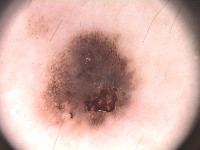</td><td>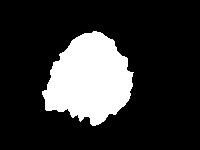</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем **сегментировать** их.

In [1]:
!gdown 1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql

Downloading...
From (original): https://drive.google.com/uc?id=1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql
From (redirected): https://drive.google.com/uc?id=1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql&confirm=t&uuid=4e440257-215c-4c15-9a68-130b3fd3188f
To: /content/PH2Dataset.rar
100% 162M/162M [00:02<00:00, 65.1MB/s]


In [2]:
get_ipython().system_raw("unrar x PH2Dataset.rar")

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

Для загрузки датасета можно использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [3]:
images = []
lesions = []
from skimage.io import imread
import os
root = 'PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2 Dataset images')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений можно использовать [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [4]:
from skimage.transform import resize
size = (256, 256)
# constant - пиксели за пределами изображения (за это отвечает mode)
# заполняются константой (0 если не передано конкретное)

# anti_aliasing - сглаживание при изменении размеров
# для бинарных масок (Y) его отключают для четких границ объектов
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [5]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

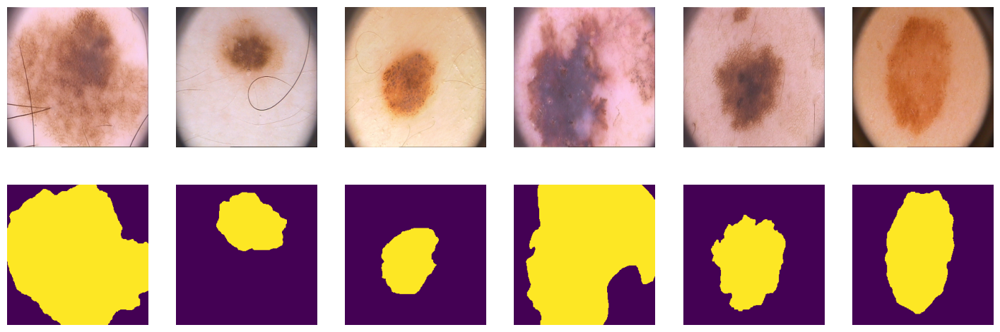

In [6]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 100/50/50
 для обучения, валидации и теста соответственно

Здесь мы рандомно выбираем индексы:

In [7]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [8]:
print(len(tr), len(val), len(ts))

100 50 50


## PyTorch DataLoader

In [9]:
from torch.utils.data import DataLoader
batch_size = 25

# изменяем порядок осей с rollaxis: изначально (высота, ширина, каналы)
# а теперь (каналы, высота, ширина)
train_dataloader = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])),
                     batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=False)
test_dataloader = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=False)


In [10]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Шаг 2. Метрика качества модели

## IoU (intersection over union)

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Что будет являться пересением и объединением в задаче сегментации?

Давайте разберем следующий пример:





<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1rBYFgli48AUUN9idiyq8j3J5DboB93yN" width=1000 height=800/></p>

In [11]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 26.9 MB/s eta 0:00:00


Инициация метрики IoU, задаем вероятностный порог для определения класса (>0.5 => 1 класс), бинарная классификация

In [12]:
from torchmetrics import JaccardIndex

iou_score = JaccardIndex(threshold=0.5, task="binary", average='micro').to(device)

# Задания: Построй свой первый бейзлайн!

Итак, загрузка файлов, код датасета и даталоадера написана за вас. Метрика IoU написана за вас! Вам остается написать лосс, модель и функции обучения и теста модели.

* Построй свой первый бейзлайн! [6]
  * BCE Loss [2]
  * SegNet [2]
  * Train [1]
  * Test [1]

## Шаг 3. Loss функция - BCE [2 балла]

Популярным лоссом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right] \space [1]$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=-\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right) \space [2]$$

### Вывод численно стабильной формулы BCE лосса [1 балл]



Выведите из формулы [1] формулу [2]:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right] \space [1]$$

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right) \space [2]$$

Не забываем, что здесь $\hat y_i$ - это логиты сети, не вероятности и не лейблы.

**Ответ:**



Получились слеующие выкладки:
$$y_i \cdot -\log(\sigma(\hat y_i)) + (1 - y_i) \cdot -\log(1 - \sigma(\hat y_i))$$ $$= y_i \cdot -\log\left(\frac{1}{1 + e^{-\hat y_i}}\right) + (1 - y_i) \cdot -\log\left(\frac{e^{-\hat y_i}}{1 + e^{-\hat y_i}}\right)$$ $$= y_i \cdot \log(1 + e^{-\hat y_i}) + (1 - y_i) \cdot \left(-\log(e^{-\hat y_i}) + \log(1 + e^{-\hat y_i})\right)$$ $$= y_i \cdot \log(1 + e^{-\hat y_i}) + (1 - y_i) \cdot (\hat y_i + \log(1 + e^{-\hat y_i}))$$ $$= y_i \cdot \log(1 + e^{-\hat y_i}) + \hat y_i - y_i \cdot \hat y_i + (1 - y_i) \cdot \log(1 + e^{-\hat y_i})$$ $$= \hat y_i - y_i \cdot \hat y_i + \log(1 + e^{-\hat y_i}) \cdot (y_i + 1 - y_i)$$ $$= \hat y_i - y_i \cdot \hat y_i + \log(1 + e^{-\hat y_i})$$



### Реализуйте в коде оба варианта лосса [1 балл]

Реализуйте следующие функции:

*   `bce_true()` - честная прямая реализация лосса с формулой $$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$
*   `bce_loss()` - реализация формулы, которую мы вывели $$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

И сравните результаты функций с реализацией Pytorch:
*   `bce_torch()`
*   `bce_torch_with_logits()`

In [13]:
import torch.nn.functional as F
import torch.nn as nn

In [14]:
bce_torch = nn.BCELoss(reduction='sum') # (sigmoid(y_pred), y_real)
bce_torch_with_logits = nn.BCEWithLogitsLoss(reduction='sum')

In [15]:
def sigmoid(x):
  return 1 / (1 + math.exp(-x))


In [16]:
def bce_loss(y_pred, y_real):
  bce = y_pred - y_pred*y_real + torch.log(1 + torch.exp(-y_pred))
  # Суммируем все элементы, чтобы получить скалярную потерю
  return torch.sum(bce)

def bce_true(y_pred, y_real):
  bce = - (y_real * torch.log(torch.sigmoid(y_pred)) + (1-y_real)*torch.log(1-torch.sigmoid(y_pred)))
  # Суммируем все элементы, чтобы получить скалярную потерю
  return torch.sum(bce)

Проверим корректность работы на простом примере


In [17]:
y_pred = torch.randn(3, 2, requires_grad=False)
y_true = torch.rand(3, 2, requires_grad=False)

print(f'BCE loss from scratch bce_loss             = {bce_loss(y_pred, y_true)}')
print(f'BCE loss честно посчитанный                = {bce_true(y_pred, y_true)}')
print(f'BCE loss from torch bce_torch              = {bce_torch(torch.sigmoid(y_pred), y_true)}')
print(f'BCE loss from torch with logits bce_torch  = {bce_torch_with_logits(y_pred, y_true)}')


BCE loss from scratch bce_loss             = 3.7764132022857666
BCE loss честно посчитанный                = 3.7764129638671875
BCE loss from torch bce_torch              = 3.7764129638671875
BCE loss from torch with logits bce_torch  = 3.7764129638671875


Инструкции `assert` в Python — это булевы выражения, которые проверяют, является ли условие истинным (`True`). Внизу в коде мы проверяем функция `bce_loss()` выдает тот же результат, что и функция из Pytorch или нет. Если равенства не будет, что будет означать, что результаты функций не совпадают, а значит вы неправильно реализовали фукнцию `bce_loss()`, `assert` возвратит ошибку.

Функция `numpy.isclose()` используется для сравнения двух чисел с учётом допустимой погрешности. Она особенно полезна при работе с числами с плавающей точкой, где точное сравнение может быть проблематичным из-за ограничений представления таких чисел в компьютере.

Как она работает?

`numpy.isclose(a, b, rtol=1e-05, atol=1e-08) `принимает два числа (`a` и `b`) и сравнивает их, учитывая относительную и абсолютную погрешность. Если разница между двумя числами меньше заданного порога, функция возвращает `True`, иначе — `False`.

Параметры:

    rtol: Относительная погрешность (по умолчанию 1e-05). Используется для определения разницы относительно большего значения.
    atol: Абсолютная погрешность (по умолчанию 1e-08). Определяет минимальную разницу, которую следует учитывать.

Мы будем использовать `assert` и `numpy.isclose()` для проверки корректности нашего кода.

In [18]:
assert np.isclose(bce_loss(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true))
assert np.isclose(bce_loss(y_pred, y_true), bce_torch_with_logits(y_pred, y_true))
assert np.isclose(bce_true(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true))
assert np.isclose(bce_true(y_pred, y_true), bce_torch_with_logits(y_pred, y_true))

Давайте теперь посчитаем на простом примере, но с теми же размерностями, что и в датасете

In [19]:
y_pred = torch.randn((2, 1, 3, 3), requires_grad=False)
y_true = torch.randint(0, 2, (2, 1, 3, 3))

print(f'BCE loss from scratch bce_loss            = {bce_loss(y_pred, y_true)}')
print(f'BCE loss честно посчитанный               = {bce_true(y_pred, y_true)}')
print(f'BCE loss from torch bce_torch             = {bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float))}')
print(f'BCE loss from torch with logits bce_torch = {bce_torch_with_logits(y_pred, y_true.to(torch.float))}')

BCE loss from scratch bce_loss            = 12.150137901306152
BCE loss честно посчитанный               = 12.150136947631836
BCE loss from torch bce_torch             = 12.150136947631836
BCE loss from torch with logits bce_torch = 12.150136947631836


In [20]:
assert np.isclose(bce_loss(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float)))
assert np.isclose(bce_loss(y_pred, y_true), bce_torch_with_logits(y_pred, y_true.to(torch.float)))
assert np.isclose(bce_true(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float)))
assert np.isclose(bce_true(y_pred, y_true), bce_torch_with_logits(y_pred, y_true.to(torch.float)))

Давайте посчитаем на реальных логитах и сегментационной маске:

In [21]:
!gdown --folder 1EX0RW1TRQVkLmR1h6miCQqyhYPFyg28M

Retrieving folder contents
Processing file 1--WxvBdpMn_NOmYPf3a4au8MHzfx5baC labels.pt
Processing file 1-0A7_CS_vKiSCkgIDJ4joThCEcFedA3I logits.pt
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1--WxvBdpMn_NOmYPf3a4au8MHzfx5baC
To: /content/for_asserts/labels.pt
100% 1.18k/1.18k [00:00<00:00, 5.02MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-0A7_CS_vKiSCkgIDJ4joThCEcFedA3I
To: /content/for_asserts/logits.pt
100% 1.18k/1.18k [00:00<00:00, 5.59MB/s]
Download completed


In [22]:
path_to_dummy_samples = '/content/for_asserts'
dummpy_sample = {'logits': torch.load(f'{path_to_dummy_samples}/logits.pt'),
                 'labels': torch.load(f'{path_to_dummy_samples}/labels.pt')}
dummpy_sample['labels'] = dummpy_sample['labels'].to(device)
dummpy_sample['logits'] = dummpy_sample['logits'].to(device)

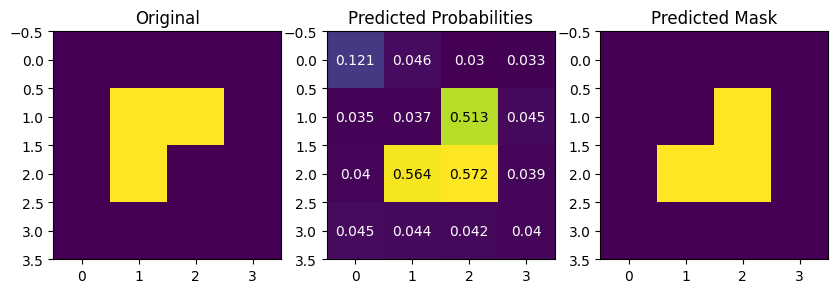

In [23]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize= (10,3*10))

ax1.imshow(dummpy_sample['labels'].squeeze(1)[0].cpu())
ax1.set_title("Original")

ax2.imshow(dummpy_sample['logits'].sigmoid().squeeze(1)[0].cpu())
for (j,i),label in np.ndenumerate(dummpy_sample['logits'].sigmoid().squeeze(1)[0].cpu()):
    if label < 0.5:
        color = 'white'
    else:
        color = 'black'
    ax2.text(i,j,round(label,3), color=color, ha='center',va='center')

ax2.set_title("Predicted Probabilities")

ax3.imshow((dummpy_sample['logits'].sigmoid() > 0.5).squeeze(1)[0].cpu())
ax3.set_title("Predicted Mask")
plt.show()

Проверяем на данном примере:

In [24]:
bce_loss_score = bce_loss(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu())
bce_true_score = bce_true(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu())
bce_torch_score = bce_torch(torch.sigmoid(dummpy_sample['logits'].cpu()), dummpy_sample['labels'].cpu().float())
bce_torch_with_logits_score = bce_torch_with_logits(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu().float())
assert np.isclose(bce_loss_score, bce_torch_score)
assert np.isclose(bce_loss_score, bce_torch_with_logits_score)
assert np.isclose(bce_true_score, bce_torch_score)
assert np.isclose(bce_true_score, bce_torch_with_logits_score)

## Шаг 4. Модель SegNet [2 балла]

Ваше задание здесь состоит в том, чтобы реализовать SegNet архитектуру.

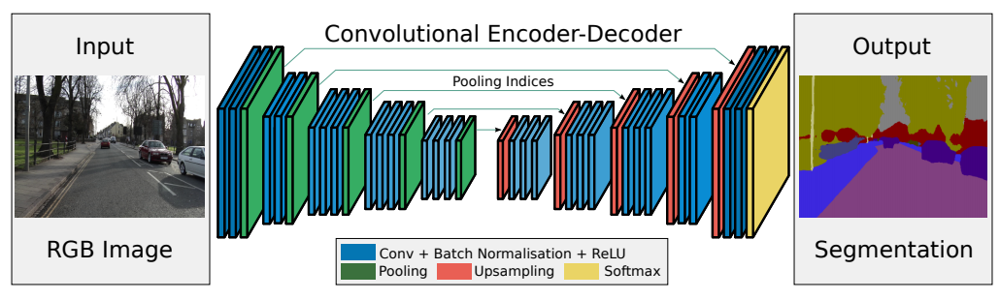

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

In [25]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки. Для этого скачаем и изучим feature extractor VGG-16, который лежит в основе SegNet.

In [ ]:
model_vgg16 = models.vgg16(weights = models.VGG16_Weights.IMAGENET1K_V1)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:05<00:00, 103MB/s] 


In [ ]:
model_vgg16

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

Feature extractor VGG-16 состоит из 5 блоков:
- два блока со структурой:
Conv2d -> ReLU -> Conv2d -> ReLU -> MaxPool2d (*)
- три блока со структурой:
Conv2d -> ReLU -> Conv2d -> ReLU -> Conv2d -> ReLU -> MaxPool2d (**)

В первом блоке - на входе три канала (по числу каналов в изображениях), которые конволюционный слой преобразует в 64 канала.

Во втором, третьем и четвертом блоках первый конволюционный слой удваивает количество каналов, а последующие конволюционные слои не меняют количество каналов.

В последнем блоке число каналов от слоя к слою не меняется.

Теперь напишем код одного блока энкодера нашей модели SegNet.  

За "микроблок" будем считать `(Conv+BN+ReLU)`, так как он есть в обеих структурах выше. Это реализовано в ините перед циклом и в самом цикле

Если у нас `depth=2`, тогда создается `(Conv+BN+ReLU)` + `(Conv+BN+ReLU)` и затем `MaxPool2d`, что соответствует (*)

Если у нас `depth=3`, тогда создается `(Conv+BN+ReLU)` + `(Conv+BN+ReLU)` + `(Conv+BN+ReLU)` и затем `MaxPool2d`, что соответствует (**)


In [26]:
# Параметрами блока будут:
# - количество каналов на входе
# - количество каналов на выходе
# - глубина блока (2 или 3, по количеству конволюционных слоев)
# - kernel_size и padding
#
class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, depth, kernel_size = 3, padding = 1):
        super(EncoderBlock, self).__init__() # инициируем экземляр класса, наследующего от nn.Module
        self.layers = nn.ModuleList() # в self.layers будем добавлять слои блока
        # дальше реализуем то, что на картинке выше обозначено Conv + Batch Normalization + ReLU
        self.layers.append(nn.Conv2d(in_channels = in_channels, out_channels = out_channels, kernel_size = kernel_size, padding = padding))
        self.layers.append(nn.BatchNorm2d(out_channels))
        self.layers.append(nn.ReLU(inplace=True))

        # цикл for помогает использовать один код для блоков как с глубиной 2, так и с глубиной 3
        for i in range(depth-1):
            self.layers.append(nn.Conv2d(in_channels = out_channels, out_channels = out_channels, kernel_size = kernel_size, padding = padding))
            self.layers.append(nn.BatchNorm2d(out_channels))
            self.layers.append(nn.ReLU(inplace=True))

        self.maxpooling = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True) #добавляем MaxPool с индексами для последующего Unpooling

    # Обратите внимание: на вход метод forward() получает карту признаков (х),
    # а возвращает карту признаков и индексы для последующего Unpooling
    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        x, indices = self.maxpooling(x)
        return x, indices


По аналогии напишите код одного блока декодера.

К карте признаков на входе каждого блока примеяется nn.MaxUnpool2d с индексами из симметричного блока энкодера. Затем повторяется связка Conv + Batch Normalization + ReLU. Количество каналов меняется зеркально блокам энкодера:
- в первом блоке декодера количество каналов не меняется
- во 2-4 блоках декодера количество каналов уменьшается в 2 раза после прохождения последнего конволюционного слоя
- на выходе из последнего блока декодера 1 канал

Обратите внимание, что после последней конволюции последнего блока декодера не применяется батч-нормализация и функция активации.

In [27]:
class DecoderBlock(nn.Module):
  def __init__(self, in_channels, out_channels, depth, kernel_size = 3, padding = 1, final_layer = False):
      super(DecoderBlock, self).__init__() # инициируем экземляр класса, наследующего от nn.Module

      self.unpooling = nn.MaxUnpool2d(kernel_size=2, stride=2)
      self.layers = nn.ModuleList() # в self.layers будем добавлять слои блока

      # дальше реализуем то, что на картинке выше обозначено Conv + Batch Normalization + ReLU
      self.layers.append(nn.Conv2d(in_channels = in_channels, out_channels = out_channels, kernel_size = kernel_size, padding = padding))

      if not final_layer:
          self.layers.append(nn.BatchNorm2d(out_channels))
          self.layers.append(nn.ReLU(inplace=True))

      for i in range(depth-1):
          if final_layer:
              self.layers.append(nn.Conv2d(in_channels = out_channels, out_channels = out_channels, kernel_size = kernel_size, padding = padding))
          else:
              self.layers.append(nn.Conv2d(in_channels = out_channels, out_channels = out_channels, kernel_size = kernel_size, padding = padding))
              self.layers.append(nn.BatchNorm2d(out_channels))
              self.layers.append(nn.ReLU(inplace=True))

  def forward(self, x, indices):
    x = self.unpooling(x, indices)
    for layer in self.layers:
        x = layer(x)

    return x

Соединим блоки энкодера и декодера в модель SegNet:

**Энкодер:**

* В первом блоке - на входе три канала (по числу каналов в изображениях), которые конволюционный слой преобразует в 64 канала.

* Во втором, третьем и четвертом блоках первый конволюционный слой удваивает количество каналов, а последующие конволюционные слои не меняют количество каналов.

* В последнем блоке число каналов от слоя к слою не меняется.

**Декодер:**

* В первом блоке декодера количество каналов не меняется

* Во 2-4 блоках декодера количество каналов уменьшается в 2 раза после прохождения последнего конволюционного слоя
на выходе из последнего блока декодера 1 канал

* Обратите внимание, что после последней конволюции последнего блока декодера не применяется батч-нормализация и функция активации.

In [28]:
class SegNet(nn.Module):
    def __init__(self, in_channels=3, out_channels = 1, num_features = 64) -> None:
        super(SegNet, self).__init__()

        # Encoder
        self.encoder0 = EncoderBlock(in_channels, num_features, depth=2)
        self.encoder1 = EncoderBlock(num_features, num_features * 2, depth=2)
        self.encoder2 = EncoderBlock(num_features * 2, num_features * 4, depth=3)
        self.encoder3 = EncoderBlock(num_features * 4, num_features * 8, depth=3)

        # Encoder bottleneck - количество каналов на входе и на выходе одинаково
        self.encoder4 = EncoderBlock(num_features * 8, num_features * 8, depth=3)

        # Decoder bottleneck
        self.decoder4 = DecoderBlock(num_features * 8, num_features * 8, depth=3)

        # Decoder
        self.decoder3 = DecoderBlock(num_features * 8, num_features * 4, depth=3)
        self.decoder2 = DecoderBlock(num_features * 4, num_features * 2, depth=3)
        self.decoder1 = DecoderBlock(num_features * 2, num_features, depth=2) # Исправлено: self.decoder1
        self.decoder0 = DecoderBlock(num_features, out_channels, depth=2, final_layer=True)

    def forward(self, x):
        # encoder
        x, indices0 = self.encoder0(x)
        x, indices1 =  self.encoder1(x)
        x, indices2 =  self.encoder2(x)
        x, indices3 =  self.encoder3(x)
        x, indices4 =  self.encoder4(x)

        # decoder
        x = self.decoder4(x, indices4)
        x = self.decoder3(x, indices3)
        x = self.decoder2(x, indices2)
        x = self.decoder1(x, indices1) # Исправлено: вызов self.decoder1
        output = self.decoder0(x, indices0) # Исправлено: вызов self.decoder0
        return output  # no activation

## Шаг 5. Тренировка модели [1 балл]

Напишите функции для обучения модели.

In [29]:
from tqdm.notebook import tqdm

In [30]:
def train(model, dataloader, optimizer, loss_fn, device):
    model.train()
    running_loss = 0.0
    running_iou = 0.0

    for X_batch, Y_batch in tqdm(dataloader, desc="Training"):
        X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)

        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = loss_fn(outputs, Y_batch)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * X_batch.size(0)

        # Calculate IoU
        with torch.no_grad():
            iou = iou_score(outputs.sigmoid(), Y_batch)
            running_iou += iou.item() * X_batch.size(0)

    epoch_loss = running_loss / len(dataloader.dataset)
    epoch_iou = running_iou / len(dataloader.dataset)
    return epoch_loss, epoch_iou


In [31]:
def validate(model, dataloader, loss_fn, device):
    model.eval()
    running_loss = 0.0
    running_iou = 0.0

    with torch.no_grad():
        for X_batch, Y_batch in tqdm(dataloader, desc="Validation"):
            X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)
            outputs = model(X_batch)
            loss = loss_fn(outputs, Y_batch)

            running_loss += loss.item() * X_batch.size(0)

            iou = iou_score(outputs.sigmoid(), Y_batch)
            running_iou += iou.item() * X_batch.size(0)

    epoch_loss = running_loss / len(dataloader.dataset)
    epoch_iou = running_iou / len(dataloader.dataset)
    return epoch_loss, epoch_iou


In [32]:
def fit(model, train_dataloader, valid_dataloader, optimizer, loss_fn, device, epochs, model_name="best_model"):
    best_valid_loss = float('inf')
    history = {'train_loss': [], 'train_iou': [], 'valid_loss': [], 'valid_iou': []}

    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        train_loss, train_iou = train(model, train_dataloader, optimizer, loss_fn, device)
        valid_loss, valid_iou = validate(model, valid_dataloader, loss_fn, device)

        history['train_loss'].append(train_loss)
        history['train_iou'].append(train_iou)
        history['valid_loss'].append(valid_loss)
        history['valid_iou'].append(valid_iou)

        print(f"  Train Loss: {train_loss:.4f}, Train IoU: {train_iou:.4f}")
        print(f"  Valid Loss: {valid_loss:.4f}, Valid IoU: {valid_iou:.4f}")

        if valid_loss < best_valid_loss:
            best_valid_loss = valid_loss
            torch.save(model.state_dict(), f'{model_name}.pth')
            print(f"  Saved best model with Valid Loss: {best_valid_loss:.4f}")

    return history

In [33]:
import matplotlib.pyplot as plt

def plot_history(history):
    epochs = range(1, len(history["train_iou"]) + 1)

    # Accuracy
    plt.figure(figsize=(7,4))
    plt.plot(epochs, history["train_iou"], label="train")
    plt.plot(epochs, history["valid_iou"], label="valid")
    plt.xlabel("Epoch")
    plt.ylabel("IoU")
    plt.title("IoU per epoch")
    plt.grid(True)
    plt.legend()
    plt.show()

    # Loss
    plt.figure(figsize=(7,4))
    plt.plot(epochs, history["train_loss"], label="train")
    plt.plot(epochs, history["valid_loss"], label="valid")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss per epoch")
    plt.grid(True)
    plt.legend()
    plt.show()


Обучите модель **SegNet**. В качестве оптимайзера можно взять Adam.

In [36]:
segnet_model = SegNet().to(device)
optimizer = optim.Adam(segnet_model.parameters(), lr=1e-4)
criterion = nn.BCEWithLogitsLoss(reduction='mean') # Изменено с 'sum' на 'mean'


history_segnet_bce = fit(segnet_model,
              train_dataloader,
              valid_dataloader,
              optimizer,
              loss_fn = criterion,
              device = device,
              epochs = 50,
              model_name="segnet_bce_baseline")

Epoch 1/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.7081, Train IoU: 0.3074
  Valid Loss: 0.7092, Valid IoU: 0.3387
  Saved best model with Valid Loss: 0.7092
Epoch 2/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.6810, Train IoU: 0.3359
  Valid Loss: 0.7076, Valid IoU: 0.3387
  Saved best model with Valid Loss: 0.7076
Epoch 3/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.6661, Train IoU: 0.3881
  Valid Loss: 0.7041, Valid IoU: 0.3327
  Saved best model with Valid Loss: 0.7041
Epoch 4/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.6479, Train IoU: 0.4547
  Valid Loss: 0.6991, Valid IoU: 0.2601
  Saved best model with Valid Loss: 0.6991
Epoch 5/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.6352, Train IoU: 0.5186
  Valid Loss: 0.6931, Valid IoU: 0.2500
  Saved best model with Valid Loss: 0.6931
Epoch 6/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.6282, Train IoU: 0.5348
  Valid Loss: 0.6879, Valid IoU: 0.2189
  Saved best model with Valid Loss: 0.6879
Epoch 7/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.6178, Train IoU: 0.5743
  Valid Loss: 0.6827, Valid IoU: 0.1802
  Saved best model with Valid Loss: 0.6827
Epoch 8/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.6042, Train IoU: 0.6255
  Valid Loss: 0.6779, Valid IoU: 0.1533
  Saved best model with Valid Loss: 0.6779
Epoch 9/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5941, Train IoU: 0.6573
  Valid Loss: 0.6629, Valid IoU: 0.2390
  Saved best model with Valid Loss: 0.6629
Epoch 10/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5843, Train IoU: 0.6860
  Valid Loss: 0.6440, Valid IoU: 0.3609
  Saved best model with Valid Loss: 0.6440
Epoch 11/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5757, Train IoU: 0.6997
  Valid Loss: 0.6010, Valid IoU: 0.5558
  Saved best model with Valid Loss: 0.6010
Epoch 12/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5653, Train IoU: 0.7366
  Valid Loss: 0.5746, Valid IoU: 0.6547
  Saved best model with Valid Loss: 0.5746
Epoch 13/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5586, Train IoU: 0.7406
  Valid Loss: 0.5481, Valid IoU: 0.7064
  Saved best model with Valid Loss: 0.5481
Epoch 14/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5491, Train IoU: 0.7598
  Valid Loss: 0.5415, Valid IoU: 0.7200
  Saved best model with Valid Loss: 0.5415
Epoch 15/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5414, Train IoU: 0.7409
  Valid Loss: 0.5279, Valid IoU: 0.7236
  Saved best model with Valid Loss: 0.5279
Epoch 16/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5338, Train IoU: 0.7780
  Valid Loss: 0.5104, Valid IoU: 0.7814
  Saved best model with Valid Loss: 0.5104
Epoch 17/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5237, Train IoU: 0.7725
  Valid Loss: 0.5092, Valid IoU: 0.7644
  Saved best model with Valid Loss: 0.5092
Epoch 18/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5221, Train IoU: 0.7387
  Valid Loss: 0.5019, Valid IoU: 0.8011
  Saved best model with Valid Loss: 0.5019
Epoch 19/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5130, Train IoU: 0.7320
  Valid Loss: 0.5163, Valid IoU: 0.5900
Epoch 20/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5041, Train IoU: 0.7537
  Valid Loss: 0.4983, Valid IoU: 0.6775
  Saved best model with Valid Loss: 0.4983
Epoch 21/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4994, Train IoU: 0.7512
  Valid Loss: 0.4807, Valid IoU: 0.6995
  Saved best model with Valid Loss: 0.4807
Epoch 22/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4883, Train IoU: 0.7549
  Valid Loss: 0.4805, Valid IoU: 0.7412
  Saved best model with Valid Loss: 0.4805
Epoch 23/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4784, Train IoU: 0.7656
  Valid Loss: 0.4664, Valid IoU: 0.7581
  Saved best model with Valid Loss: 0.4664
Epoch 24/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4707, Train IoU: 0.7739
  Valid Loss: 0.4673, Valid IoU: 0.7744
Epoch 25/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4641, Train IoU: 0.7716
  Valid Loss: 0.4555, Valid IoU: 0.7974
  Saved best model with Valid Loss: 0.4555
Epoch 26/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4562, Train IoU: 0.7921
  Valid Loss: 0.4482, Valid IoU: 0.7814
  Saved best model with Valid Loss: 0.4482
Epoch 27/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4480, Train IoU: 0.7846
  Valid Loss: 0.4391, Valid IoU: 0.7802
  Saved best model with Valid Loss: 0.4391
Epoch 28/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4410, Train IoU: 0.8142
  Valid Loss: 0.4422, Valid IoU: 0.7605
Epoch 29/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4336, Train IoU: 0.8095
  Valid Loss: 0.4389, Valid IoU: 0.7664
  Saved best model with Valid Loss: 0.4389
Epoch 30/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4298, Train IoU: 0.8017
  Valid Loss: 0.4629, Valid IoU: 0.6424
Epoch 31/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4219, Train IoU: 0.7811
  Valid Loss: 0.4742, Valid IoU: 0.6281
Epoch 32/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4142, Train IoU: 0.7988
  Valid Loss: 0.4427, Valid IoU: 0.6873
Epoch 33/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4130, Train IoU: 0.8058
  Valid Loss: 0.4266, Valid IoU: 0.7618
  Saved best model with Valid Loss: 0.4266
Epoch 34/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4088, Train IoU: 0.7716
  Valid Loss: 0.4299, Valid IoU: 0.7034
Epoch 35/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4090, Train IoU: 0.8118
  Valid Loss: 0.4774, Valid IoU: 0.5668
Epoch 36/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3987, Train IoU: 0.7548
  Valid Loss: 0.4380, Valid IoU: 0.6448
Epoch 37/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3925, Train IoU: 0.7841
  Valid Loss: 0.4054, Valid IoU: 0.7250
  Saved best model with Valid Loss: 0.4054
Epoch 38/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3815, Train IoU: 0.7931
  Valid Loss: 0.4343, Valid IoU: 0.6531
Epoch 39/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3923, Train IoU: 0.7481
  Valid Loss: 0.4024, Valid IoU: 0.7313
  Saved best model with Valid Loss: 0.4024
Epoch 40/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3874, Train IoU: 0.7941
  Valid Loss: 0.8941, Valid IoU: 0.3845
Epoch 41/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3859, Train IoU: 0.7821
  Valid Loss: 0.6598, Valid IoU: 0.4106
Epoch 42/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3775, Train IoU: 0.7326
  Valid Loss: 0.5454, Valid IoU: 0.5019
Epoch 43/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3637, Train IoU: 0.8144
  Valid Loss: 0.4334, Valid IoU: 0.6202
Epoch 44/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3669, Train IoU: 0.7676
  Valid Loss: 0.3916, Valid IoU: 0.7015
  Saved best model with Valid Loss: 0.3916
Epoch 45/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3658, Train IoU: 0.7584
  Valid Loss: 0.4226, Valid IoU: 0.7455
Epoch 46/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3501, Train IoU: 0.8064
  Valid Loss: 0.3631, Valid IoU: 0.7929
  Saved best model with Valid Loss: 0.3631
Epoch 47/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3401, Train IoU: 0.8094
  Valid Loss: 0.3649, Valid IoU: 0.7533
Epoch 48/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3371, Train IoU: 0.7944
  Valid Loss: 0.3432, Valid IoU: 0.7741
  Saved best model with Valid Loss: 0.3432
Epoch 49/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3261, Train IoU: 0.8409
  Valid Loss: 0.3708, Valid IoU: 0.7152
Epoch 50/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3273, Train IoU: 0.8198
  Valid Loss: 0.3608, Valid IoU: 0.7325


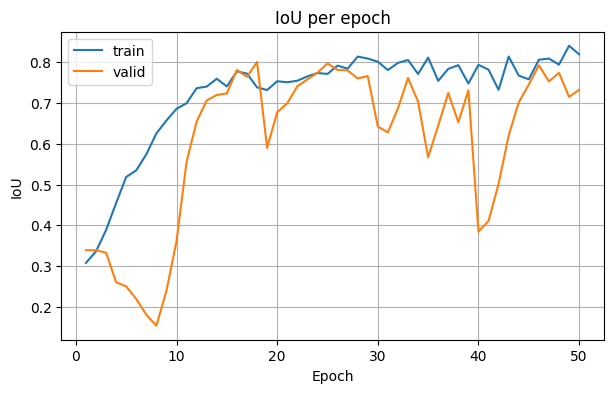

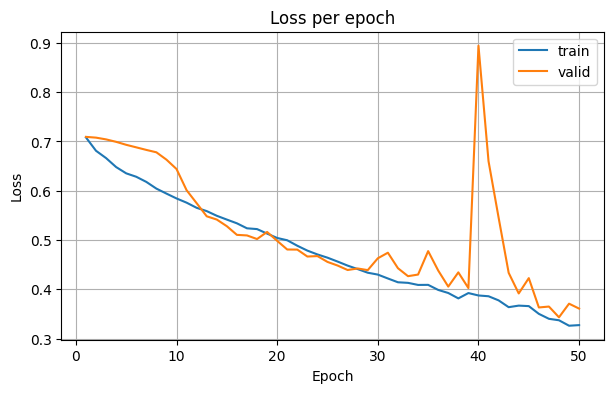

In [37]:
plot_history(history_segnet_bce)

## Шаг 6. Инференс [1 балл]

После обучения модели напишите функцию теста, воспользуйтесь лучшим чекпоинтом и протестируйте работу модели на тестовой выборке.

In [38]:
def test(model, dataloader, loss_fn, device):
    model.eval()  # Set the model to evaluation mode
    running_loss = 0.0
    running_iou = 0.0

    with torch.no_grad():
        for X_batch, Y_batch in tqdm(dataloader, desc="Testing"):
            X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)
            outputs = model(X_batch)
            loss = loss_fn(outputs, Y_batch)

            running_loss += loss.item() * X_batch.size(0)

            iou = iou_score(outputs.sigmoid(), Y_batch)

            running_iou += iou.item() * X_batch.size(0)

    test_loss = running_loss / len(dataloader.dataset)
    test_iou = running_iou / len(dataloader.dataset)
    print(f"Test Loss: {test_loss:.4f}, Test IoU: {test_iou:.4f}")
    return test_loss, test_iou

In [39]:
test_segnet_bce = test(segnet_model,
              test_dataloader,
              loss_fn = criterion,
              device = device)



Testing:   0%|          | 0/2 [00:00<?, ?it/s]

Test Loss: 0.3705, Test IoU: 0.7057


Если необходимо сохранить модель и историю лоссов и метрики:

In [56]:
'''
import os

save_path = '/content/drive/MyDrive/Colab Notebooks/блок HW_6/'
os.makedirs(save_path, exist_ok=True)

torch.save(segnet_model.state_dict(), os.path.join(save_path, 'segnet_bce.pth'))
torch.save(history_segnet_bce, os.path.join(save_path, 'history_segnet_bce.pt'))
torch.save(test_segnet_bce, os.path.join(save_path, 'test_segnet_bce.pt'))
'''

# Задания: Мир других лоссов!

## Пробуем другие функции потерь [2 балла]

В данном разделе вам потребуется имплементировать две функции потерь: DICE и Focal loss.


### Dice Loss

**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

В терминах матрицы ошибок она будет считаться следующим образом:

$$D(X,Y) = \frac{2TP}{2TP + FP + FN}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1- D(X, Y)$$

**Hints** (!):

1. Не забудьте подумать о численной нестабильности, возникающей в математической формуле при ситуации, когда $\frac{0}{0}$, т.е. вам нужно добавить очень маленькое число, например $\epsilon = 1e^{-8}$, в обе части дроби при подсчете $D(X,Y)$:

$$D(X,Y) = \frac{2TP + ϵ}{2TP + FP + FN + ϵ}$$

2. Dice метрика(!), не лосс, считается похожим образом как IoU:

    2.1. На вход вам приходят logits, т.е. значения от $-∞$ до $∞$. Их переводим в вероятности от 0 до 1 при помощи функции Sigmoid.

    2.2. Фиксируем порог, например threshold=0.5, и всему что ниже порога ставим значение 0, всему что выше 1. Получаем предсказанную маску из 0 и 1.

    2.3. Считаем TP, FP, FN

    2.4. Считаем DICE метрику по формуле

Вы можете прописать для себя функцию `dice_score()` и сравнить с результатами работы функции из библиотеки `torchmetrics`.

3. Но с метрикой есть проблема, что она не дифференцируема, и если вы захотите просто взять и прописать `dice_loss` = 1 - `dice_score`, Pytorch поругается на вас и скажет, что это недифференцируемая метрика. Чтобы посчитать dice_loss делаем следующие шаги:

    3.1. На вход вам приходят logits, т.е. значения от $-∞$ до $∞$. Их переводим в вероятности от 0 до 1 при помощи функции Sigmoid.

    3.2. Здесь нам уже не нужно фиксировать порог, мы просто работаем с вероятностями. Значения вероятностей дифференцируемы и через них будут протекать градиенты.

    3.3. Считаем TP, FP, FN также как и в Dice метрике, только вместо маски, подаем вероятности.

    3.4. Считаем DICE метрику по формуле

    3.5. Считаем лосс как Loss = 1 - DICE

Итак, давайте сначала пропишем dice_score.

In [40]:
import torch

In [41]:
def dice_score(logits: torch.Tensor, labels: torch.Tensor, threshold: float = 0.5):
    '''
    Это именно метрика, не лосс.
    '''
    probs = torch.sigmoid(logits)
    preds = (probs > threshold).float()

    preds = preds.view(-1)
    labels = labels.view(-1)

    TP = (preds * labels).sum()
    FN = ((1 - preds)*labels).sum() # preds=0, labels=1
    FP = ((1 - labels)*preds).sum()

    eps = 1e-8
    score = (2*TP + eps)/(2*TP + FP + FN + eps)
    return score

Проверим на корректность функцию dice_score:

In [42]:
from torchmetrics.segmentation import DiceScore

dice = DiceScore(num_classes=1, average='micro').to(device)
dice(dummpy_sample['logits'].sigmoid(), dummpy_sample['labels'].to(int))

/usr/local/lib/python3.12/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: DiceScore metric currently defaults to `average=micro`, but will change to`average=macro` in the v1.9 release. If you've explicitly set this parameter, you can ignore this warning.
  warnings.warn(*args, **kwargs)


tensor(0.3158, device='cuda:0')

In [ ]:
'''
если вы используете версию библиотеки 0.11.4, то можно взять torchmetrics.classification.Dice():

from torchmetrics.classification import Dice

dice = Dice(average='micro').to(device)

'''

In [43]:
assert dice(dummpy_sample['logits'].sigmoid() > 0.5, dummpy_sample['labels'].to(int)) == dice_score(
    dummpy_sample['logits'], dummpy_sample['labels'])



Давайте теперь пропишем лосс и воспользуемся библиотекой `segmentation-models-pytorch`, чтобы убедиться в корректности нашей функции.

In [44]:
def dice_loss(logits: torch.Tensor, labels: torch.Tensor):

    '''
    Это лосс.
    '''
    probs = torch.sigmoid(logits)

    probs = probs.view(-1)
    labels = labels.view(-1)

    TP = (probs * labels).sum()
    FN = ((1 - probs)*labels).sum()
    FP = ((1 - labels)*probs).sum()

    eps = 1e-8
    loss = 1 - (2*TP + eps)/(2*TP + FP + FN + eps)

    return loss

Проверка на корректность:

In [45]:
# проверьте, что у вас установлена библиотека
!pip install segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 7.2 MB/s eta 0:00:00


In [46]:
from segmentation_models_pytorch.losses import DiceLoss
dice_loss_torch = DiceLoss(mode='binary')
dice_loss_torch(dummpy_sample['logits'], dummpy_sample['labels'])

tensor(0.5756, device='cuda:0')

In [47]:
assert dice_loss_torch(dummpy_sample['logits'], dummpy_sample['labels'].to(int)) == dice_loss(
    dummpy_sample['logits'], dummpy_sample['labels'])

### Focal Loss

[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf)

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** (переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.


Из оригинальной статьи по [Focal Loss](https://arxiv.org/pdf/1708.02002.pdf):

$$p_t = \sigma(\hat y_i)y_i + (1 - \sigma(\hat y_i)) (1-y_i)$$

$$\mathcal L_{focal}(y, \hat y) = (1 - p_t)^{\gamma} \mathcal L_{BCE}(y_i, \hat y_i).$$

$$\mathcal L_{focal}(y, \hat y) = -\sum_i (1 - p_t)^{\gamma} \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

$$\mathcal L_{focal}(y, \hat y) = -\sum_i (1 - (\sigma(\hat y_i)y_i + (1 - \sigma(\hat y_i)) (1-y_i)))^{\gamma} \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

In [48]:
def focal_loss(y_real, y_pred, eps = 1e-8, gamma = 2):
    # TODO
    bce = (y_real * torch.log(torch.sigmoid(y_pred)) + (1-y_real)*torch.log(1-torch.sigmoid(y_pred)))
    loss = (1 - (torch.sigmoid(y_pred)*y_real + (1 - torch.sigmoid(y_pred)) * (1 - y_real)))**gamma * bce
    return - torch.sum(loss)

Проверка корректности функции:

In [49]:
from torchvision.ops import sigmoid_focal_loss
sigmoid_focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], alpha=-1, gamma=2, reduction='sum')

tensor(3.6161, device='cuda:0')

In [50]:
focal_loss(dummpy_sample['labels'], dummpy_sample['logits'], gamma=2.0)

tensor(3.6161, device='cuda:0')

In [51]:
assert torch.isclose(sigmoid_focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], alpha=-1, gamma=2, reduction='sum'), focal_loss(
    dummpy_sample['labels'], dummpy_sample['logits'], gamma=2.0))

## [BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаем вам написать одну функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее, и провести численное сравнение с предыдущими функциями.

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

Я выбрала Tversky loss и так как это модификация Dice loss, то с ним и буду сравнивать

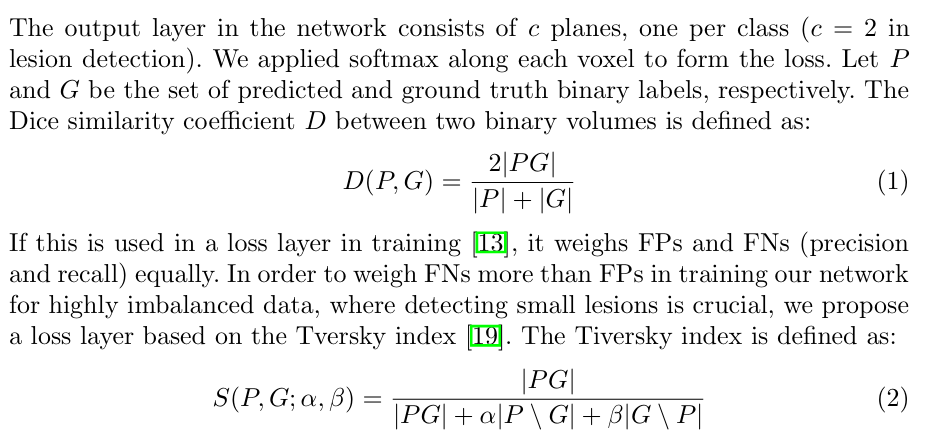

При этом через термины TP, TN, FP, FN формула переписывается так:

$$S(P, G; α, β) = \frac{TP}{TP + α*FP + β*FN}$$

In [52]:
def tversky_loss(logits: torch.Tensor, labels: torch.Tensor, alpha: float = 0.5, beta: float = 0.5):
    probs = torch.sigmoid(logits)

    probs = probs.view(-1)
    labels = labels.view(-1)

    TP = (probs * labels).sum()
    FN = ((1 - probs)*labels).sum()
    FP = ((1 - labels)*probs).sum()

    eps = 1e-8
    tversky = (TP + eps) / (TP + alpha * FP + beta * FN + eps)

    loss = 1 - tversky
    return torch.sum(loss)


In [53]:
print(f"Dice Loss: {dice_loss(dummpy_sample['logits'], dummpy_sample['labels'])} ")
print(f"Tversky Loss: {tversky_loss(dummpy_sample['logits'], dummpy_sample['labels'])} ")

Dice Loss: 0.5755997896194458 
Tversky Loss: 0.5755997896194458 


## Обучите SegNet на новых лоссах

**Задание**: обучите SegNet на новых лоссах и сравните все три лосса:
*   При каком лоссе модель сходится быстрее?
*   При каком лоссе модель выдает наилучшую метрику?

Напишите развернутый ответ на вопросы.



**Dice**

In [57]:
segnet_model = SegNet().to(device)
optimizer = optim.Adam(segnet_model.parameters(), lr=1e-4)
criterion = DiceLoss(mode='binary')


history_segnet_dice = fit(segnet_model,
              train_dataloader,
              valid_dataloader,
              optimizer,
              loss_fn = criterion,
              device = device,
              epochs = 50,
              model_name="segnet_dice")


Epoch 1/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5860, Train IoU: 0.3233
  Valid Loss: 0.5755, Valid IoU: 0.3387
  Saved best model with Valid Loss: 0.5755
Epoch 2/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5776, Train IoU: 0.3212
  Valid Loss: 0.5757, Valid IoU: 0.3387
Epoch 3/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5687, Train IoU: 0.3228
  Valid Loss: 0.5763, Valid IoU: 0.3387
Epoch 4/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5626, Train IoU: 0.3235
  Valid Loss: 0.5772, Valid IoU: 0.3387
Epoch 5/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5600, Train IoU: 0.3233
  Valid Loss: 0.5784, Valid IoU: 0.3387
Epoch 6/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5559, Train IoU: 0.3245
  Valid Loss: 0.5797, Valid IoU: 0.3387
Epoch 7/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5471, Train IoU: 0.3244
  Valid Loss: 0.5808, Valid IoU: 0.3387
Epoch 8/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5445, Train IoU: 0.3247
  Valid Loss: 0.5777, Valid IoU: 0.3386
Epoch 9/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5424, Train IoU: 0.3249
  Valid Loss: 0.5713, Valid IoU: 0.3383
  Saved best model with Valid Loss: 0.5713
Epoch 10/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5418, Train IoU: 0.3246
  Valid Loss: 0.5558, Valid IoU: 0.3368
  Saved best model with Valid Loss: 0.5558
Epoch 11/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5331, Train IoU: 0.3252
  Valid Loss: 0.5373, Valid IoU: 0.3383
  Saved best model with Valid Loss: 0.5373
Epoch 12/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5298, Train IoU: 0.3256
  Valid Loss: 0.5089, Valid IoU: 0.3358
  Saved best model with Valid Loss: 0.5089
Epoch 13/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5283, Train IoU: 0.3259
  Valid Loss: 0.5072, Valid IoU: 0.3412
  Saved best model with Valid Loss: 0.5072
Epoch 14/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5236, Train IoU: 0.3263
  Valid Loss: 0.4983, Valid IoU: 0.3438
  Saved best model with Valid Loss: 0.4983
Epoch 15/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5162, Train IoU: 0.3274
  Valid Loss: 0.4953, Valid IoU: 0.3478
  Saved best model with Valid Loss: 0.4953
Epoch 16/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5124, Train IoU: 0.3285
  Valid Loss: 0.4919, Valid IoU: 0.3520
  Saved best model with Valid Loss: 0.4919
Epoch 17/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5108, Train IoU: 0.3311
  Valid Loss: 0.4860, Valid IoU: 0.3570
  Saved best model with Valid Loss: 0.4860
Epoch 18/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5040, Train IoU: 0.3319
  Valid Loss: 0.4834, Valid IoU: 0.3595
  Saved best model with Valid Loss: 0.4834
Epoch 19/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5018, Train IoU: 0.3391
  Valid Loss: 0.4633, Valid IoU: 0.3657
  Saved best model with Valid Loss: 0.4633
Epoch 20/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4956, Train IoU: 0.3411
  Valid Loss: 0.4862, Valid IoU: 0.3762
Epoch 21/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4971, Train IoU: 0.3560
  Valid Loss: 0.4607, Valid IoU: 0.3854
  Saved best model with Valid Loss: 0.4607
Epoch 22/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4886, Train IoU: 0.3591
  Valid Loss: 0.4836, Valid IoU: 0.4071
Epoch 23/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4848, Train IoU: 0.3768
  Valid Loss: 0.4654, Valid IoU: 0.4150
Epoch 24/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4802, Train IoU: 0.3842
  Valid Loss: 0.4608, Valid IoU: 0.4187
Epoch 25/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4757, Train IoU: 0.4038
  Valid Loss: 0.4549, Valid IoU: 0.4266
  Saved best model with Valid Loss: 0.4549
Epoch 26/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4720, Train IoU: 0.4083
  Valid Loss: 0.4624, Valid IoU: 0.4027
Epoch 27/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4679, Train IoU: 0.4280
  Valid Loss: 0.4623, Valid IoU: 0.4389
Epoch 28/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4687, Train IoU: 0.4409
  Valid Loss: 0.4455, Valid IoU: 0.4534
  Saved best model with Valid Loss: 0.4455
Epoch 29/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4585, Train IoU: 0.4502
  Valid Loss: 0.4528, Valid IoU: 0.4817
Epoch 30/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4588, Train IoU: 0.4640
  Valid Loss: 0.4452, Valid IoU: 0.5234
  Saved best model with Valid Loss: 0.4452
Epoch 31/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4502, Train IoU: 0.4761
  Valid Loss: 0.4350, Valid IoU: 0.5234
  Saved best model with Valid Loss: 0.4350
Epoch 32/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4465, Train IoU: 0.4931
  Valid Loss: 0.4325, Valid IoU: 0.5400
  Saved best model with Valid Loss: 0.4325
Epoch 33/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4435, Train IoU: 0.5078
  Valid Loss: 0.4310, Valid IoU: 0.5465
  Saved best model with Valid Loss: 0.4310
Epoch 34/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4411, Train IoU: 0.5257
  Valid Loss: 0.4272, Valid IoU: 0.5489
  Saved best model with Valid Loss: 0.4272
Epoch 35/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4348, Train IoU: 0.5435
  Valid Loss: 0.4176, Valid IoU: 0.5057
  Saved best model with Valid Loss: 0.4176
Epoch 36/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4298, Train IoU: 0.5602
  Valid Loss: 0.4325, Valid IoU: 0.4546
Epoch 37/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4288, Train IoU: 0.5752
  Valid Loss: 0.4244, Valid IoU: 0.5374
Epoch 38/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4231, Train IoU: 0.5959
  Valid Loss: 0.4189, Valid IoU: 0.5723
Epoch 39/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4178, Train IoU: 0.6110
  Valid Loss: 0.4172, Valid IoU: 0.5737
  Saved best model with Valid Loss: 0.4172
Epoch 40/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4142, Train IoU: 0.6231
  Valid Loss: 0.4104, Valid IoU: 0.6051
  Saved best model with Valid Loss: 0.4104
Epoch 41/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4090, Train IoU: 0.6384
  Valid Loss: 0.4104, Valid IoU: 0.5828
Epoch 42/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4105, Train IoU: 0.6415
  Valid Loss: 0.3995, Valid IoU: 0.6127
  Saved best model with Valid Loss: 0.3995
Epoch 43/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4032, Train IoU: 0.6516
  Valid Loss: 0.4100, Valid IoU: 0.5927
Epoch 44/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4047, Train IoU: 0.6373
  Valid Loss: 0.3967, Valid IoU: 0.6066
  Saved best model with Valid Loss: 0.3967
Epoch 45/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3989, Train IoU: 0.6374
  Valid Loss: 0.4018, Valid IoU: 0.6541
Epoch 46/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3917, Train IoU: 0.6777
  Valid Loss: 0.3892, Valid IoU: 0.6294
  Saved best model with Valid Loss: 0.3892
Epoch 47/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3892, Train IoU: 0.6815
  Valid Loss: 0.3922, Valid IoU: 0.5422
Epoch 48/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3874, Train IoU: 0.6826
  Valid Loss: 0.3847, Valid IoU: 0.5929
  Saved best model with Valid Loss: 0.3847
Epoch 49/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3804, Train IoU: 0.6795
  Valid Loss: 0.3883, Valid IoU: 0.6273
Epoch 50/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3790, Train IoU: 0.6742
  Valid Loss: 0.3713, Valid IoU: 0.6433
  Saved best model with Valid Loss: 0.3713


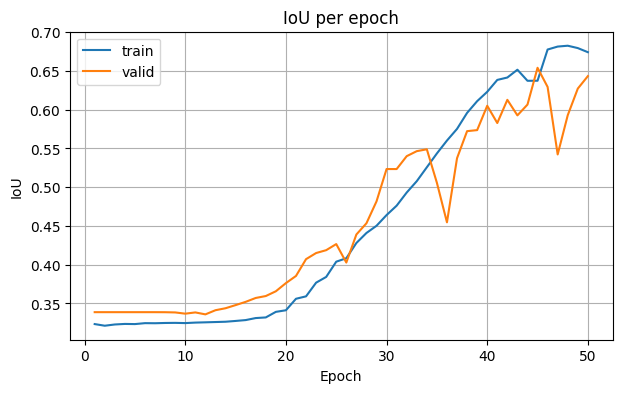

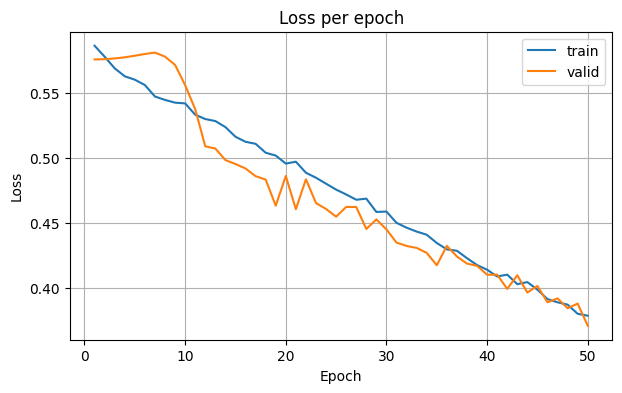

In [58]:
plot_history(history_segnet_dice)

In [59]:
test_segnet_dice = test(segnet_model,
              test_dataloader,
              loss_fn = criterion,
              device = device)

Testing:   0%|          | 0/2 [00:00<?, ?it/s]

Test Loss: 0.4079, Test IoU: 0.6193


In [62]:
'''
import os

save_path = '/content/drive/MyDrive/Colab Notebooks/блок HW_6/'
os.makedirs(save_path, exist_ok=True)

torch.save(segnet_model.state_dict(), os.path.join(save_path, 'segnet_dice.pth'))
torch.save(history_segnet_dice, os.path.join(save_path, 'history_segnet_dice.pt'))
torch.save(test_segnet_dice, os.path.join(save_path, 'test_segnet_dice.pt'))
'''

**Focal**

In [63]:
segnet_model = SegNet().to(device)
optimizer = optim.Adam(segnet_model.parameters(), lr=1e-4)
criterion = lambda outputs, targets: sigmoid_focal_loss(outputs, targets, reduction='mean')

history_segnet_focal = fit(segnet_model,
              train_dataloader,
              valid_dataloader,
              optimizer,
              loss_fn = criterion,
              device = device,
              epochs = 50,
              model_name="segnet_focal")

Epoch 1/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0828, Train IoU: 0.0412
  Valid Loss: 0.0811, Valid IoU: 0.0000
  Saved best model with Valid Loss: 0.0811
Epoch 2/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0820, Train IoU: 0.0531
  Valid Loss: 0.0810, Valid IoU: 0.0000
  Saved best model with Valid Loss: 0.0810
Epoch 3/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0814, Train IoU: 0.0623
  Valid Loss: 0.0809, Valid IoU: 0.0000
  Saved best model with Valid Loss: 0.0809
Epoch 4/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0807, Train IoU: 0.0753
  Valid Loss: 0.0806, Valid IoU: 0.0000
  Saved best model with Valid Loss: 0.0806
Epoch 5/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0798, Train IoU: 0.0849
  Valid Loss: 0.0802, Valid IoU: 0.0000
  Saved best model with Valid Loss: 0.0802
Epoch 6/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0790, Train IoU: 0.0878
  Valid Loss: 0.0796, Valid IoU: 0.0000
  Saved best model with Valid Loss: 0.0796
Epoch 7/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0783, Train IoU: 0.0905
  Valid Loss: 0.0789, Valid IoU: 0.0005
  Saved best model with Valid Loss: 0.0789
Epoch 8/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0775, Train IoU: 0.0956
  Valid Loss: 0.0783, Valid IoU: 0.0018
  Saved best model with Valid Loss: 0.0783
Epoch 9/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0767, Train IoU: 0.1012
  Valid Loss: 0.0774, Valid IoU: 0.0032
  Saved best model with Valid Loss: 0.0774
Epoch 10/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0758, Train IoU: 0.1042
  Valid Loss: 0.0758, Valid IoU: 0.0048
  Saved best model with Valid Loss: 0.0758
Epoch 11/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0751, Train IoU: 0.1112
  Valid Loss: 0.0743, Valid IoU: 0.0130
  Saved best model with Valid Loss: 0.0743
Epoch 12/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0741, Train IoU: 0.1165
  Valid Loss: 0.0728, Valid IoU: 0.0359
  Saved best model with Valid Loss: 0.0728
Epoch 13/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0734, Train IoU: 0.1168
  Valid Loss: 0.0711, Valid IoU: 0.0663
  Saved best model with Valid Loss: 0.0711
Epoch 14/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0722, Train IoU: 0.1397
  Valid Loss: 0.0702, Valid IoU: 0.1216
  Saved best model with Valid Loss: 0.0702
Epoch 15/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0711, Train IoU: 0.1493
  Valid Loss: 0.0690, Valid IoU: 0.1956
  Saved best model with Valid Loss: 0.0690
Epoch 16/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0702, Train IoU: 0.1738
  Valid Loss: 0.0682, Valid IoU: 0.3611
  Saved best model with Valid Loss: 0.0682
Epoch 17/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0690, Train IoU: 0.1885
  Valid Loss: 0.0677, Valid IoU: 0.1788
  Saved best model with Valid Loss: 0.0677
Epoch 18/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0680, Train IoU: 0.2011
  Valid Loss: 0.0657, Valid IoU: 0.3205
  Saved best model with Valid Loss: 0.0657
Epoch 19/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0668, Train IoU: 0.2328
  Valid Loss: 0.0650, Valid IoU: 0.3504
  Saved best model with Valid Loss: 0.0650
Epoch 20/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0654, Train IoU: 0.2557
  Valid Loss: 0.0643, Valid IoU: 0.2892
  Saved best model with Valid Loss: 0.0643
Epoch 21/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0642, Train IoU: 0.2851
  Valid Loss: 0.0636, Valid IoU: 0.2811
  Saved best model with Valid Loss: 0.0636
Epoch 22/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0629, Train IoU: 0.3141
  Valid Loss: 0.0630, Valid IoU: 0.2864
  Saved best model with Valid Loss: 0.0630
Epoch 23/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0619, Train IoU: 0.3437
  Valid Loss: 0.0626, Valid IoU: 0.2723
  Saved best model with Valid Loss: 0.0626
Epoch 24/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0608, Train IoU: 0.3614
  Valid Loss: 0.0607, Valid IoU: 0.4232
  Saved best model with Valid Loss: 0.0607
Epoch 25/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0597, Train IoU: 0.3850
  Valid Loss: 0.0596, Valid IoU: 0.3960
  Saved best model with Valid Loss: 0.0596
Epoch 26/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0585, Train IoU: 0.4173
  Valid Loss: 0.0589, Valid IoU: 0.3649
  Saved best model with Valid Loss: 0.0589
Epoch 27/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0575, Train IoU: 0.4445
  Valid Loss: 0.0590, Valid IoU: 0.6306
Epoch 28/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0572, Train IoU: 0.4376
  Valid Loss: 0.0605, Valid IoU: 0.6221
Epoch 29/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0558, Train IoU: 0.4619
  Valid Loss: 0.0599, Valid IoU: 0.5742
Epoch 30/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0539, Train IoU: 0.4819
  Valid Loss: 0.0585, Valid IoU: 0.5232
  Saved best model with Valid Loss: 0.0585
Epoch 31/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0528, Train IoU: 0.5283
  Valid Loss: 0.0601, Valid IoU: 0.5487
Epoch 32/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0514, Train IoU: 0.5616
  Valid Loss: 0.0537, Valid IoU: 0.5329
  Saved best model with Valid Loss: 0.0537
Epoch 33/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0504, Train IoU: 0.5772
  Valid Loss: 0.0512, Valid IoU: 0.6470
  Saved best model with Valid Loss: 0.0512
Epoch 34/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0500, Train IoU: 0.5673
  Valid Loss: 0.0509, Valid IoU: 0.6188
  Saved best model with Valid Loss: 0.0509
Epoch 35/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0478, Train IoU: 0.6120
  Valid Loss: 0.0495, Valid IoU: 0.6820
  Saved best model with Valid Loss: 0.0495
Epoch 36/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0469, Train IoU: 0.6166
  Valid Loss: 0.0478, Valid IoU: 0.6933
  Saved best model with Valid Loss: 0.0478
Epoch 37/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0452, Train IoU: 0.6659
  Valid Loss: 0.0470, Valid IoU: 0.6736
  Saved best model with Valid Loss: 0.0470
Epoch 38/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0452, Train IoU: 0.6659
  Valid Loss: 0.0459, Valid IoU: 0.7098
  Saved best model with Valid Loss: 0.0459
Epoch 39/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0438, Train IoU: 0.6605
  Valid Loss: 0.0421, Valid IoU: 0.6657
  Saved best model with Valid Loss: 0.0421
Epoch 40/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0432, Train IoU: 0.6805
  Valid Loss: 0.0428, Valid IoU: 0.6823
Epoch 41/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0421, Train IoU: 0.6689
  Valid Loss: 0.0402, Valid IoU: 0.7572
  Saved best model with Valid Loss: 0.0402
Epoch 42/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0416, Train IoU: 0.6915
  Valid Loss: 0.0414, Valid IoU: 0.6417
Epoch 43/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0393, Train IoU: 0.7183
  Valid Loss: 0.0393, Valid IoU: 0.6661
  Saved best model with Valid Loss: 0.0393
Epoch 44/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0383, Train IoU: 0.7263
  Valid Loss: 0.0393, Valid IoU: 0.7580
Epoch 45/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0367, Train IoU: 0.7531
  Valid Loss: 0.0393, Valid IoU: 0.7353
  Saved best model with Valid Loss: 0.0393
Epoch 46/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0356, Train IoU: 0.7889
  Valid Loss: 0.0380, Valid IoU: 0.7578
  Saved best model with Valid Loss: 0.0380
Epoch 47/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0347, Train IoU: 0.8069
  Valid Loss: 0.0371, Valid IoU: 0.7667
  Saved best model with Valid Loss: 0.0371
Epoch 48/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0335, Train IoU: 0.8045
  Valid Loss: 0.0367, Valid IoU: 0.7115
  Saved best model with Valid Loss: 0.0367
Epoch 49/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0323, Train IoU: 0.8264
  Valid Loss: 0.0366, Valid IoU: 0.6967
  Saved best model with Valid Loss: 0.0366
Epoch 50/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0315, Train IoU: 0.8526
  Valid Loss: 0.0349, Valid IoU: 0.7305
  Saved best model with Valid Loss: 0.0349


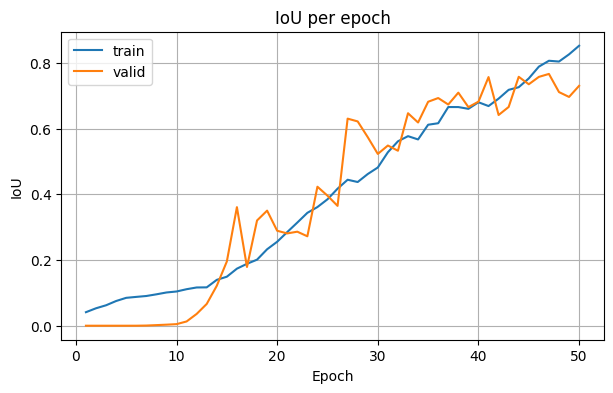

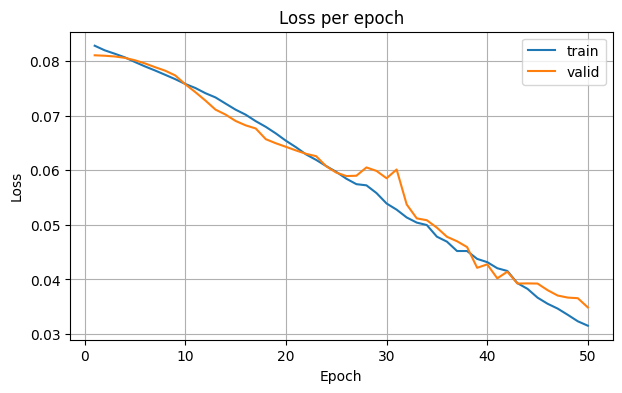

In [64]:
plot_history(history_segnet_focal)

In [65]:
test_segnet_focal = test(segnet_model,
              test_dataloader,
              loss_fn = criterion,
              device = device)

Testing:   0%|          | 0/2 [00:00<?, ?it/s]

Test Loss: 0.0346, Test IoU: 0.7082


In [66]:
import os

save_path = '/content/drive/MyDrive/Colab Notebooks/блок HW_6/'
os.makedirs(save_path, exist_ok=True)

torch.save(segnet_model.state_dict(), os.path.join(save_path, 'segnet_focal.pth'))
torch.save(history_segnet_focal, os.path.join(save_path, 'history_segnet_focal.pt'))
torch.save(test_segnet_focal, os.path.join(save_path, 'test_segnet_focal.pt'))

**Tversky**

In [67]:
segnet_model = SegNet().to(device)
optimizer = optim.Adam(segnet_model.parameters(), lr=1e-4)
criterion = tversky_loss


history_segnet_tversky = fit(segnet_model,
              train_dataloader,
              valid_dataloader,
              optimizer,
              loss_fn = criterion,
              device =device,
              epochs = 50,
              model_name="segnet_tvesky")

Epoch 1/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.6185, Train IoU: 0.0661
  Valid Loss: 0.6192, Valid IoU: 0.0000
  Saved best model with Valid Loss: 0.6192
Epoch 2/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5996, Train IoU: 0.2692
  Valid Loss: 0.6211, Valid IoU: 0.0000
Epoch 3/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5749, Train IoU: 0.4848
  Valid Loss: 0.6241, Valid IoU: 0.0000
Epoch 4/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5602, Train IoU: 0.6313
  Valid Loss: 0.6276, Valid IoU: 0.0000
Epoch 5/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5410, Train IoU: 0.7514
  Valid Loss: 0.6319, Valid IoU: 0.0000
Epoch 6/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5307, Train IoU: 0.7534
  Valid Loss: 0.6360, Valid IoU: 0.0000
Epoch 7/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5222, Train IoU: 0.7731
  Valid Loss: 0.6399, Valid IoU: 0.0000
Epoch 8/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5037, Train IoU: 0.8232
  Valid Loss: 0.6427, Valid IoU: 0.0000
Epoch 9/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4945, Train IoU: 0.8374
  Valid Loss: 0.6114, Valid IoU: 0.1912
  Saved best model with Valid Loss: 0.6114
Epoch 10/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4880, Train IoU: 0.8139
  Valid Loss: 0.5835, Valid IoU: 0.3375
  Saved best model with Valid Loss: 0.5835
Epoch 11/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4755, Train IoU: 0.8320
  Valid Loss: 0.5443, Valid IoU: 0.4728
  Saved best model with Valid Loss: 0.5443
Epoch 12/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4678, Train IoU: 0.8301
  Valid Loss: 0.4811, Valid IoU: 0.6568
  Saved best model with Valid Loss: 0.4811
Epoch 13/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4561, Train IoU: 0.8545
  Valid Loss: 0.4763, Valid IoU: 0.6610
  Saved best model with Valid Loss: 0.4763
Epoch 14/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4505, Train IoU: 0.8425
  Valid Loss: 0.4552, Valid IoU: 0.7222
  Saved best model with Valid Loss: 0.4552
Epoch 15/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4404, Train IoU: 0.8554
  Valid Loss: 0.4032, Valid IoU: 0.7903
  Saved best model with Valid Loss: 0.4032
Epoch 16/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4303, Train IoU: 0.8635
  Valid Loss: 0.4388, Valid IoU: 0.7805
Epoch 17/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4208, Train IoU: 0.8777
  Valid Loss: 0.3706, Valid IoU: 0.8132
  Saved best model with Valid Loss: 0.3706
Epoch 18/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4141, Train IoU: 0.8748
  Valid Loss: 0.3858, Valid IoU: 0.8231
Epoch 19/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4042, Train IoU: 0.8740
  Valid Loss: 0.4165, Valid IoU: 0.8170
Epoch 20/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4009, Train IoU: 0.8669
  Valid Loss: 0.3590, Valid IoU: 0.8293
  Saved best model with Valid Loss: 0.3590
Epoch 21/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3983, Train IoU: 0.8428
  Valid Loss: 0.3704, Valid IoU: 0.8070
Epoch 22/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3895, Train IoU: 0.8449
  Valid Loss: 0.3532, Valid IoU: 0.8206
  Saved best model with Valid Loss: 0.3532
Epoch 23/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3749, Train IoU: 0.8802
  Valid Loss: 0.4032, Valid IoU: 0.7872
Epoch 24/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3724, Train IoU: 0.8696
  Valid Loss: 0.3490, Valid IoU: 0.8270
  Saved best model with Valid Loss: 0.3490
Epoch 25/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3578, Train IoU: 0.8976
  Valid Loss: 0.3439, Valid IoU: 0.8238
  Saved best model with Valid Loss: 0.3439
Epoch 26/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3483, Train IoU: 0.9119
  Valid Loss: 0.3410, Valid IoU: 0.8405
  Saved best model with Valid Loss: 0.3410
Epoch 27/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3475, Train IoU: 0.8935
  Valid Loss: 0.3348, Valid IoU: 0.8506
  Saved best model with Valid Loss: 0.3348
Epoch 28/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3397, Train IoU: 0.8980
  Valid Loss: 0.3406, Valid IoU: 0.8481
Epoch 29/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3384, Train IoU: 0.8894
  Valid Loss: 0.3385, Valid IoU: 0.8388
Epoch 30/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3225, Train IoU: 0.9223
  Valid Loss: 0.3270, Valid IoU: 0.8457
  Saved best model with Valid Loss: 0.3270
Epoch 31/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3178, Train IoU: 0.9080
  Valid Loss: 0.3167, Valid IoU: 0.8463
  Saved best model with Valid Loss: 0.3167
Epoch 32/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3161, Train IoU: 0.9088
  Valid Loss: 0.3066, Valid IoU: 0.8423
  Saved best model with Valid Loss: 0.3066
Epoch 33/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3036, Train IoU: 0.9278
  Valid Loss: 0.3081, Valid IoU: 0.8345
Epoch 34/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3004, Train IoU: 0.9121
  Valid Loss: 0.3008, Valid IoU: 0.8619
  Saved best model with Valid Loss: 0.3008
Epoch 35/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2883, Train IoU: 0.9403
  Valid Loss: 0.2915, Valid IoU: 0.8733
  Saved best model with Valid Loss: 0.2915
Epoch 36/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2845, Train IoU: 0.9328
  Valid Loss: 0.2923, Valid IoU: 0.8734
Epoch 37/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2809, Train IoU: 0.9271
  Valid Loss: 0.2810, Valid IoU: 0.8668
  Saved best model with Valid Loss: 0.2810
Epoch 38/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2756, Train IoU: 0.9330
  Valid Loss: 0.2810, Valid IoU: 0.8707
Epoch 39/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2784, Train IoU: 0.9065
  Valid Loss: 0.2858, Valid IoU: 0.8496
Epoch 40/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2709, Train IoU: 0.9154
  Valid Loss: 0.2887, Valid IoU: 0.8270
Epoch 41/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2579, Train IoU: 0.9324
  Valid Loss: 0.2785, Valid IoU: 0.8212
  Saved best model with Valid Loss: 0.2785
Epoch 42/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2554, Train IoU: 0.9292
  Valid Loss: 0.2691, Valid IoU: 0.8174
  Saved best model with Valid Loss: 0.2691
Epoch 43/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2483, Train IoU: 0.9218
  Valid Loss: 0.2694, Valid IoU: 0.8270
Epoch 44/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2437, Train IoU: 0.9368
  Valid Loss: 0.2535, Valid IoU: 0.8526
  Saved best model with Valid Loss: 0.2535
Epoch 45/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2382, Train IoU: 0.9289
  Valid Loss: 0.2538, Valid IoU: 0.8609
Epoch 46/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2308, Train IoU: 0.9438
  Valid Loss: 0.2567, Valid IoU: 0.8637
Epoch 47/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2378, Train IoU: 0.9191
  Valid Loss: 0.2563, Valid IoU: 0.8571
Epoch 48/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2240, Train IoU: 0.9302
  Valid Loss: 0.2443, Valid IoU: 0.8450
  Saved best model with Valid Loss: 0.2443
Epoch 49/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2302, Train IoU: 0.9144
  Valid Loss: 0.2638, Valid IoU: 0.8199
Epoch 50/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2232, Train IoU: 0.9044
  Valid Loss: 0.2444, Valid IoU: 0.8333


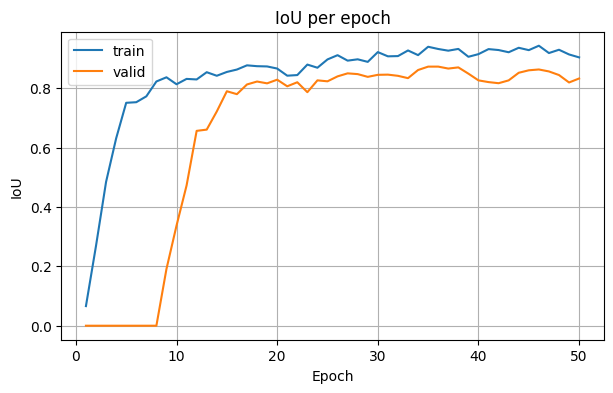

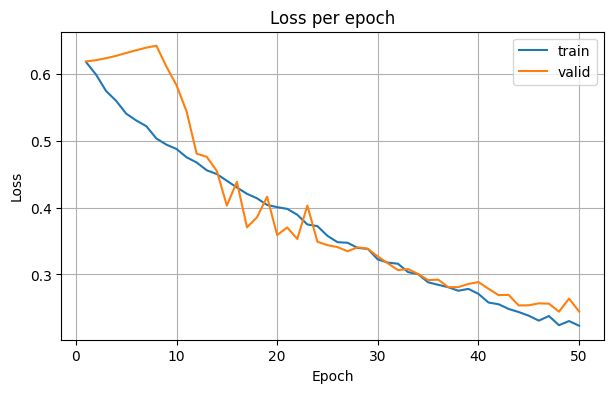

In [68]:
plot_history(history_segnet_tversky)

In [69]:
test_segnet_tversky = test(segnet_model,
              test_dataloader,
              loss_fn = criterion,
              device = device)

Testing:   0%|          | 0/2 [00:00<?, ?it/s]

Test Loss: 0.2710, Test IoU: 0.8135


In [70]:
import os

save_path = '/content/drive/MyDrive/Colab Notebooks/блок HW_6/'
os.makedirs(save_path, exist_ok=True)

torch.save(segnet_model.state_dict(), os.path.join(save_path, 'segnet_tversky.pth'))
torch.save(history_segnet_tversky, os.path.join(save_path, 'history_segnet_tversky.pt'))
torch.save(test_segnet_tversky, os.path.join(save_path, 'test_segnet_tversky.pt'))

*   При каком лоссе модель выдает наилучшую метрику?

Лучшее IoU у tversky:

In [82]:
print(f'Valid segnet BCE IoU: {history_segnet_bce["valid_iou"][-1]}')
print(f'Valid segnet dice IoU: {history_segnet_dice["valid_iou"][-1]}')
print(f'Valid segnet focal IoU: {history_segnet_focal["valid_iou"][-1]}')
print(f'Valid segnet tversky IoU: {history_segnet_tversky["valid_iou"][-1]}')


Valid segnet BCE IoU: 0.7325165271759033
Valid segnet dice IoU: 0.6433474123477936
Valid segnet focal IoU: 0.7305384278297424
Valid segnet tversky IoU: 0.833329826593399


In [83]:
print(f'Test segnet BCE IoU: {test_segnet_bce[1]}')
print(f'Test segnet dice IoU: {test_segnet_dice[1]}')
print(f'Test segnet focal IoU: {test_segnet_focal[1]}')
print(f'Test segnet tversky IoU: {test_segnet_tversky[1]}')


Test segnet BCE IoU: 0.7057133316993713
Test segnet dice IoU: 0.6193241477012634
Test segnet focal IoU: 0.7081554234027863
Test segnet tversky IoU: 0.813460648059845


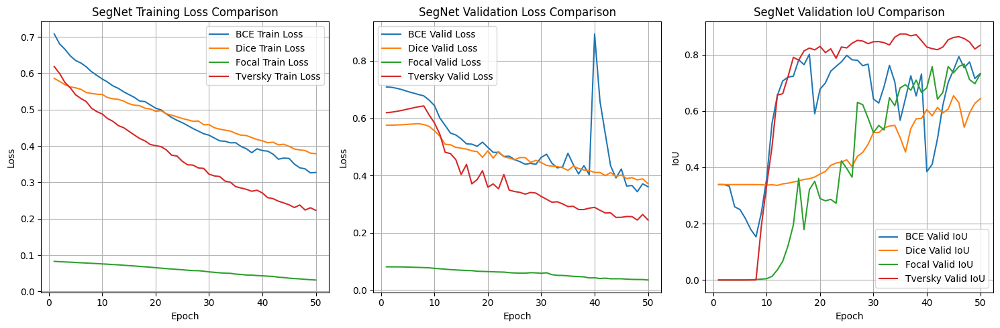

In [84]:
import matplotlib.pyplot as plt

def plot_multiple_histories(histories, title_prefix="", metric_name="IoU"):
    plt.figure(figsize=(15, 5))

    # Plot Training Losses
    plt.subplot(1, 3, 1)
    for name, history in histories.items():
        epochs = range(1, len(history['train_loss']) + 1)
        plt.plot(epochs, history['train_loss'], label=f'{name} Train Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'{title_prefix} Training Loss Comparison')
    plt.grid(True)
    plt.legend()

    # Plot Validation Losses
    plt.subplot(1, 3, 2)
    for name, history in histories.items():
        epochs = range(1, len(history['valid_loss']) + 1)
        plt.plot(epochs, history['valid_loss'], label=f'{name} Valid Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'{title_prefix} Validation Loss Comparison')
    plt.grid(True)
    plt.legend()

    # Plot Validation IoU
    plt.subplot(1, 3, 3)
    for name, history in histories.items():
        epochs = range(1, len(history['valid_iou']) + 1)
        plt.plot(epochs, history['valid_iou'], label=f'{name} Valid {metric_name}')
    plt.xlabel('Epoch')
    plt.ylabel(metric_name)
    plt.title(f'{title_prefix} Validation {metric_name} Comparison')
    plt.grid(True)
    plt.legend()

    plt.tight_layout()
    plt.show()

histories_segnet = {
    "BCE": history_segnet_bce,
    "Dice": history_segnet_dice,
    "Focal": history_segnet_focal,
    "Tversky": history_segnet_tversky,
}

plot_multiple_histories(histories_segnet, title_prefix="SegNet")


*   При каком лоссе модель сходится быстрее?

Может показаться, что схождение у Focal Loss лучше, но он изначально стартует с довольно маленьким лоссом. А вот

По поводу лоссов: области определения у них разные, у dice и tversky от 0 до 1, а у остальных от 0 до бесконечности. Поэтому нормируем их, чтобы оценить как быстро они сходятся

In [87]:
def normalize_loss(losses):
    min_loss = min(losses)
    max_loss = max(losses)
    return [(l - min_loss) / (max_loss - min_loss) for l in losses]
models = {
    "BCE": history_segnet_bce,
    "Dice": history_segnet_dice,
    "Focal": history_segnet_focal,
    "Tversky": history_segnet_tversky
}

In [88]:
norm_losses = {}
for name, log in models.items():
    norm_losses[name] = normalize_loss(log['train_loss'])


for name, losses in norm_losses.items():
    for epoch, l in enumerate(losses):
        if l < 0.1:  # 10% от начального лосса
            print(f"{name} достиг нормированного порога на эпохе {epoch+1}")
            break


BCE достиг нормированного порога на эпохе 43
Dice достиг нормированного порога на эпохе 45
Focal достиг нормированного порога на эпохе 46
Tversky достиг нормированного порога на эпохе 41


In [89]:
norm_valid_losses = {}
for name, log in models.items():
    norm_valid_losses[name] = normalize_loss(log['valid_loss'])

for name, losses in norm_valid_losses.items():
    for epoch, l in enumerate(losses):
        if l < 0.1:  # 10% от начального лосса
            print(f"{name} достиг нормированного порога на эпохе {epoch+1}")
            break


BCE достиг нормированного порога на эпохе 44
Dice достиг нормированного порога на эпохе 46
Focal достиг нормированного порога на эпохе 43
Tversky достиг нормированного порога на эпохе 37


# Задание: Новая модель!

## Модель U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

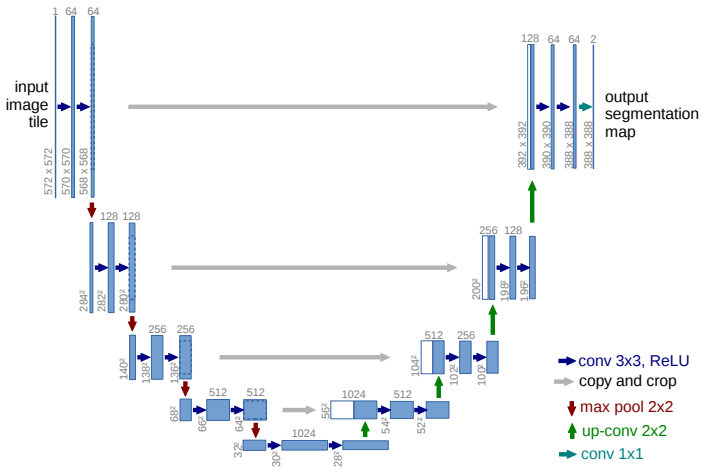

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

В оригинальной статье авторы не использовали padding внутри модели (это видно по тому, что размеры карты признаков уменьшаются на 2 каждый раз при движении от слоя к слою). При этом размеры входных изображений авторы единоразово увеличили при помощи mirror padding.

В этом домашнем задании вы можете применить альтернативный подход - сохранять размеры карт признаков при помощью padding = 1 во внутренних слоях.  

In [91]:
import torch.nn.functional as F
import torch.nn as nn

Для реализации UNet вы можете написать классы блоков энкодера и декодера отдельно, как мы сделали при реализации SegNet.

In [92]:
import segmentation_models_pytorch as smp
import torch

# Создание модели U-Net
# Вы можете выбрать различные энкодеры и предобученные веса.
# encoder_name: 'resnet34', 'efficientnet-b0', 'mobilenet_v2' и т.д.
# encoder_weights: 'imagenet' для использования весов, предобученных на ImageNet.
# in_channels: Количество входных каналов (3 для RGB изображений).
# classes: Количество выходных классов (например, 1 для бинарной сегментации,
#          N для мультиклассовой сегментации, где N - количество классов + фон).

model_unet_smp = smp.Unet(
    encoder_name="resnet34",        # Выбор энкодера (например, ResNet34)
    encoder_weights="imagenet",     # Использование предобученных на ImageNet весов для энкодера
    in_channels=3,                  # Входные каналы модели (3 для RGB)
    classes=1,                      # Выходные каналы модели (1 для бинарной сегментации: объект/фон)
)

print(model_unet_smp)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

Архитектура UNet:
1. Encoder
    1. Начало -  `(Conv+BN+ReLU+MaxPool)`
    2. 1 слой - 3 BasicBlock: `(Conv+BN+ReLU+Conv+BN)`
    3. 2 слой - 1 NewBasicBlock: BasicBlock + downsample:`(Conv+BN)` и 3 BasicBlock
    3. 3 слой - 1 NewBasicBlock и 5 BasicBlock
    4. 4 слой - 1 NewBasicBlock и 2 BasicBlock
  
2. Decoder
    1. 5 DecoderBlock: `(Conv+BN+ReLU+Conv+BN+ReLU)`
    2. segmentation_head: `(Conv2d+activation)`




Мой BasicBlock реализуется в цикле for, а если у него есть downsample (то есть структура NewBasicBlock), то она реализуется через флаг downsample

In [93]:
class Unet_EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, depth, kernel_size = 3, padding = 1):
        super(EncoderBlock, self).__init__() # инициируем экземляр класса, наследующего от nn.Module
        self.layers = nn.ModuleList() # в self.layers будем добавлять слои блока
        # дальше реализуем то, что на картинке выше обозначено Conv + Batch Normalization + ReLU
        self.layers.append(nn.Conv2d(in_channels = in_channels, out_channels = out_channels, kernel_size = kernel_size, padding = padding))
        self.layers.append(nn.BatchNorm2d(out_channels))
        self.layers.append(nn.ReLU(inplace=True))
        self.maxpooling = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True) #добавляем MaxPool с индексами для последующего Unpooling

        # цикл for помогает использовать один код для блоков как с глубиной 2, так и с глубиной 3
        for i in range(depth-1):
            self.layers.append(nn.Conv2d(in_channels = out_channels, out_channels = out_channels, kernel_size = kernel_size, padding = padding))
            self.layers.append(nn.BatchNorm2d(out_channels))
            self.layers.append(nn.ReLU(inplace=True))


    # Обратите внимание: на вход метод forward() получает карту признаков (х),
    # а возвращает карту признаков и индексы для последующего Unpooling
    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        x, indices = self.maxpooling(x)
        return x, indices


In [94]:
class BasicBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.proj = None
        if in_channels != out_channels:
            self.proj = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False),
                nn.BatchNorm2d(out_channels),
            )

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.proj is not None:
            identity = self.proj(identity)

        out = out + identity
        out = self.relu(out)
        return out


In [95]:
class UNet(nn.Module):
    def __init__(self, n_class=1):
        super().__init__()

        # encoder
        self.encoder0 = self.first(3, 64)                       # conv(stride=2) + pool(return_indices)
        self.encoder1 = self.basic_block(64, 64, depth=3)       # без pool
        self.encoder2 = self.basic_block(64, 128, depth=3, downsample=True)
        self.encoder3 = self.basic_block(128, 256, depth=5, downsample=True)
        self.encoder4 = self.basic_block(256, 512, depth=2, downsample=True)

        self.unpool = nn.MaxUnpool2d(kernel_size=2, stride=2)

        # decoder (как в твоих каналах)
        self.decoder0 = self.decoder_block(768, 256)
        self.decoder1 = self.decoder_block(384, 128)
        self.decoder2 = self.decoder_block(192, 64)
        self.decoder3 = self.decoder_block(128, 32)

        # для восстановления после conv stride=2 в encoder0 (там нет индексов)
        self.up_last = nn.ConvTranspose2d(32, 32, kernel_size=2, stride=2)
        self.decoder4 = self.decoder_block(32, 16)

        self.segm_head = nn.Conv2d(16, n_class, kernel_size=3, padding=1)

        # ВАЖНО для BCEWithLogitsLoss: без sigmoid
        self.activation = nn.Identity()

    def first(self, in_channels, out_channels):
        conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )
        pool = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        return nn.ModuleDict({"conv": conv, "pool": pool})

    def basic_block(self, in_channels, out_channels, depth, downsample=False):
        blocks = []
        blocks.append(BasicBlock(in_channels, out_channels))
        for _ in range(depth - 1):
            blocks.append(BasicBlock(out_channels, out_channels))

        pool = None
        if downsample:
            pool = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        return nn.ModuleDict({
            "blocks": nn.Sequential(*blocks),
            "pool": pool,
        })

    def decoder_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(out_channels, out_channels, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def _enc_forward(self, stage, x):
        """
        Делает: blocks -> (опционально) pool(return_indices)
        Возвращает:
          x_out   : выход после pool (если он есть) или после blocks (если pool нет)
          idx     : индексы pool или None
          size    : размер тензора ДО pool (нужен для output_size в unpool) или None
          skip    : feature map для skip-connection (в нашем случае — x_out до перехода дальше)
        """
        x = stage["blocks"](x)

        pool = stage["pool"]
        if pool is not None:
            size = x.size()
            x, idx = pool(x)
            # skip для декодера должен быть на этом (уже пониженном) разрешении,
            # поэтому берем x (после pool). Это совпадает с ожидаемыми concat каналами.
            skip = x
        else:
            idx, size = None, None
            skip = x

        return x, idx, size, skip

    def forward(self, x):
        # encoder0
        x0 = self.encoder0["conv"](x)               # /2, 64
        size0 = x0.size()
        x, idx0 = self.encoder0["pool"](x0)         # /4, 64

        # encoder1 (без pool)
        x1, idx1, size1, skip1 = self._enc_forward(self.encoder1, x)   # /4, 64  (skip для decoder2)

        # encoder2..4 (blocks -> pool)
        x2, idx2, size2, skip2 = self._enc_forward(self.encoder2, x1)  # /8, 128 (skip для decoder1)
        x3, idx3, size3, skip3 = self._enc_forward(self.encoder3, x2)  # /16,256 (skip для decoder0)
        x4, idx4, size4, _     = self._enc_forward(self.encoder4, x3)  # /32,512 (bottleneck)

        # decoder0: unpool x4 (/32->/16) + skip3(256) => 768
        d = self.unpool(x4, idx4, output_size=size4)      # 512, /16
        d = torch.cat([d, skip3], dim=1)                  # 768, /16
        d = self.decoder0(d)                              # 256, /16

        # decoder1: unpool (/16->/8) + skip2(128) => 384
        d = self.unpool(d, idx3, output_size=size3)       # 256, /8
        d = torch.cat([d, skip2], dim=1)                  # 384, /8
        d = self.decoder1(d)                              # 128, /8

        # decoder2: unpool (/8->/4) + skip1(64) => 192
        d = self.unpool(d, idx2, output_size=size2)       # 128, /4
        d = torch.cat([d, skip1], dim=1)                  # 192, /4
        d = self.decoder2(d)                              # 64, /4

        # decoder3: unpool (/4->/2) + x0(64) => 128
        d = self.unpool(d, idx0, output_size=size0)       # 64, /2
        d = torch.cat([d, x0], dim=1)                     # 128, /2
        d = self.decoder3(d)                              # 32, /2

        # decoder4: /2 -> /1 (для conv stride=2 в encoder0)
        d = self.up_last(d)                               # 32, /1
        d = self.decoder4(d)                              # 16, /1

        out = self.segm_head(d)                           # logits
        return out

## Обучите UNet

Задание: обучите UNet на всех трех лоссах: BCE, Dice, Focal и сравните результаты с SegNet:
*   Какая модель дает лучшие значения по метрике?
*   Какая модель дает лучшие значения по лоссам?
*   Какая модель обучается быстрее?
*   Сравните визуально результаты SegNet и UNet.

Напишите развернутый ответ на вопросы.



In [96]:
unet_model = UNet().to(device)
optimizer = optim.Adam(unet_model.parameters(), lr=1e-4)
criterion = nn.BCEWithLogitsLoss(reduction='mean')

history_unet_bce = fit(unet_model,
              train_dataloader,
              valid_dataloader,
              optimizer,
              loss_fn = criterion,
              device = device,
              epochs = 50,
              model_name="unet_bce")

Epoch 1/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.6600, Train IoU: 0.2736
  Valid Loss: 0.6938, Valid IoU: 0.3396
  Saved best model with Valid Loss: 0.6938
Epoch 2/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.6139, Train IoU: 0.4055
  Valid Loss: 0.6858, Valid IoU: 0.0011
  Saved best model with Valid Loss: 0.6858
Epoch 3/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5832, Train IoU: 0.4773
  Valid Loss: 0.6772, Valid IoU: 0.0000
  Saved best model with Valid Loss: 0.6772
Epoch 4/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5550, Train IoU: 0.5509
  Valid Loss: 0.6673, Valid IoU: 0.0000
  Saved best model with Valid Loss: 0.6673
Epoch 5/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5305, Train IoU: 0.6135
  Valid Loss: 0.6551, Valid IoU: 0.0000
  Saved best model with Valid Loss: 0.6551
Epoch 6/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5023, Train IoU: 0.6889
  Valid Loss: 0.6458, Valid IoU: 0.0002
  Saved best model with Valid Loss: 0.6458
Epoch 7/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4764, Train IoU: 0.7517
  Valid Loss: 0.6352, Valid IoU: 0.0298
  Saved best model with Valid Loss: 0.6352
Epoch 8/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4651, Train IoU: 0.7339
  Valid Loss: 0.6092, Valid IoU: 0.1027
  Saved best model with Valid Loss: 0.6092
Epoch 9/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4467, Train IoU: 0.7785
  Valid Loss: 0.5868, Valid IoU: 0.3420
  Saved best model with Valid Loss: 0.5868
Epoch 10/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4217, Train IoU: 0.8165
  Valid Loss: 0.5454, Valid IoU: 0.4228
  Saved best model with Valid Loss: 0.5454
Epoch 11/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4095, Train IoU: 0.8116
  Valid Loss: 0.5080, Valid IoU: 0.5545
  Saved best model with Valid Loss: 0.5080
Epoch 12/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3908, Train IoU: 0.8461
  Valid Loss: 0.4588, Valid IoU: 0.6955
  Saved best model with Valid Loss: 0.4588
Epoch 13/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3840, Train IoU: 0.8337
  Valid Loss: 0.4260, Valid IoU: 0.7609
  Saved best model with Valid Loss: 0.4260
Epoch 14/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3641, Train IoU: 0.8745
  Valid Loss: 0.4087, Valid IoU: 0.7755
  Saved best model with Valid Loss: 0.4087
Epoch 15/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3605, Train IoU: 0.8539
  Valid Loss: 0.3904, Valid IoU: 0.7951
  Saved best model with Valid Loss: 0.3904
Epoch 16/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3612, Train IoU: 0.8377
  Valid Loss: 0.3664, Valid IoU: 0.8195
  Saved best model with Valid Loss: 0.3664
Epoch 17/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3346, Train IoU: 0.8897
  Valid Loss: 0.3472, Valid IoU: 0.8344
  Saved best model with Valid Loss: 0.3472
Epoch 18/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3256, Train IoU: 0.8897
  Valid Loss: 0.3376, Valid IoU: 0.8534
  Saved best model with Valid Loss: 0.3376
Epoch 19/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3212, Train IoU: 0.8747
  Valid Loss: 0.3175, Valid IoU: 0.8676
  Saved best model with Valid Loss: 0.3175
Epoch 20/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3084, Train IoU: 0.8952
  Valid Loss: 0.3747, Valid IoU: 0.7365
Epoch 21/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3054, Train IoU: 0.8805
  Valid Loss: 0.3339, Valid IoU: 0.7963
Epoch 22/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2918, Train IoU: 0.8968
  Valid Loss: 0.3043, Valid IoU: 0.8527
  Saved best model with Valid Loss: 0.3043
Epoch 23/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2814, Train IoU: 0.9063
  Valid Loss: 0.2903, Valid IoU: 0.8730
  Saved best model with Valid Loss: 0.2903
Epoch 24/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2732, Train IoU: 0.9143
  Valid Loss: 0.2879, Valid IoU: 0.8627
  Saved best model with Valid Loss: 0.2879
Epoch 25/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2660, Train IoU: 0.9123
  Valid Loss: 0.2743, Valid IoU: 0.8682
  Saved best model with Valid Loss: 0.2743
Epoch 26/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2567, Train IoU: 0.9192
  Valid Loss: 0.2703, Valid IoU: 0.8722
  Saved best model with Valid Loss: 0.2703
Epoch 27/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2549, Train IoU: 0.9060
  Valid Loss: 0.2685, Valid IoU: 0.8692
  Saved best model with Valid Loss: 0.2685
Epoch 28/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2455, Train IoU: 0.9192
  Valid Loss: 0.2682, Valid IoU: 0.8637
  Saved best model with Valid Loss: 0.2682
Epoch 29/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2387, Train IoU: 0.9254
  Valid Loss: 0.2792, Valid IoU: 0.8330
Epoch 30/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2346, Train IoU: 0.9160
  Valid Loss: 0.2616, Valid IoU: 0.8530
  Saved best model with Valid Loss: 0.2616
Epoch 31/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2256, Train IoU: 0.9280
  Valid Loss: 0.2499, Valid IoU: 0.8706
  Saved best model with Valid Loss: 0.2499
Epoch 32/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2176, Train IoU: 0.9352
  Valid Loss: 0.2427, Valid IoU: 0.8749
  Saved best model with Valid Loss: 0.2427
Epoch 33/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2227, Train IoU: 0.9165
  Valid Loss: 0.2439, Valid IoU: 0.8637
Epoch 34/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2243, Train IoU: 0.8965
  Valid Loss: 0.2526, Valid IoU: 0.8377
Epoch 35/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2050, Train IoU: 0.9332
  Valid Loss: 0.2305, Valid IoU: 0.8622
  Saved best model with Valid Loss: 0.2305
Epoch 36/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2054, Train IoU: 0.9251
  Valid Loss: 0.2273, Valid IoU: 0.8633
  Saved best model with Valid Loss: 0.2273
Epoch 37/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2047, Train IoU: 0.9150
  Valid Loss: 0.2274, Valid IoU: 0.8661
Epoch 38/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2009, Train IoU: 0.9148
  Valid Loss: 0.2245, Valid IoU: 0.8660
  Saved best model with Valid Loss: 0.2245
Epoch 39/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2172, Train IoU: 0.8798
  Valid Loss: 0.2534, Valid IoU: 0.8155
Epoch 40/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2012, Train IoU: 0.9021
  Valid Loss: 0.2301, Valid IoU: 0.8379
Epoch 41/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1899, Train IoU: 0.9177
  Valid Loss: 0.2254, Valid IoU: 0.8447
Epoch 42/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1854, Train IoU: 0.9213
  Valid Loss: 0.2103, Valid IoU: 0.8798
  Saved best model with Valid Loss: 0.2103
Epoch 43/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1760, Train IoU: 0.9371
  Valid Loss: 0.2133, Valid IoU: 0.8748
Epoch 44/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1721, Train IoU: 0.9386
  Valid Loss: 0.2105, Valid IoU: 0.8700
Epoch 45/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1719, Train IoU: 0.9376
  Valid Loss: 0.2038, Valid IoU: 0.8731
  Saved best model with Valid Loss: 0.2038
Epoch 46/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1663, Train IoU: 0.9380
  Valid Loss: 0.2071, Valid IoU: 0.8683
Epoch 47/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1817, Train IoU: 0.9051
  Valid Loss: 0.2019, Valid IoU: 0.8764
  Saved best model with Valid Loss: 0.2019
Epoch 48/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1677, Train IoU: 0.9278
  Valid Loss: 0.2052, Valid IoU: 0.8660
Epoch 49/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1578, Train IoU: 0.9386
  Valid Loss: 0.2053, Valid IoU: 0.8629
Epoch 50/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1562, Train IoU: 0.9385
  Valid Loss: 0.1946, Valid IoU: 0.8802
  Saved best model with Valid Loss: 0.1946


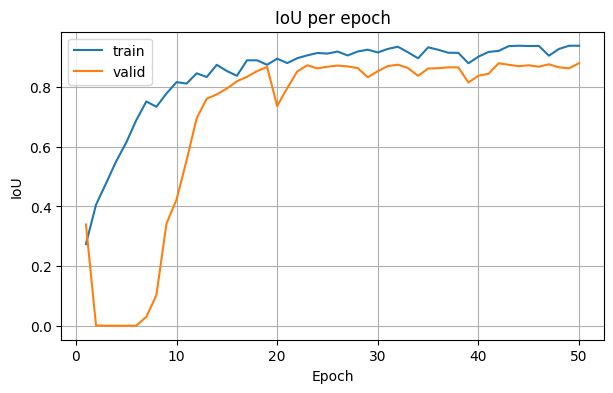

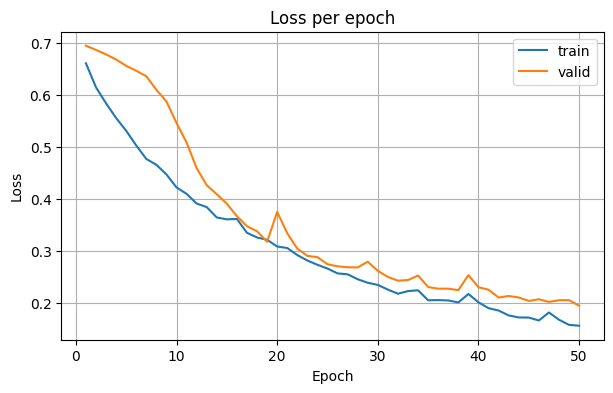

In [97]:
plot_history(history_unet_bce)

In [98]:
test_unet_bce = test(unet_model,
              test_dataloader,
              loss_fn = criterion,
              device = device)

Testing:   0%|          | 0/2 [00:00<?, ?it/s]

Test Loss: 0.2006, Test IoU: 0.8556


In [99]:
import os

save_path = '/content/drive/MyDrive/Colab Notebooks/блок HW_6/'
os.makedirs(save_path, exist_ok=True)

torch.save(unet_model.state_dict(), os.path.join(save_path, 'unet_bce.pth'))
torch.save(history_unet_bce, os.path.join(save_path, 'history_unet_bce.pt'))
torch.save(test_unet_bce, os.path.join(save_path, 'test_unet_bce.pt'))

**DICE**

In [100]:
from segmentation_models_pytorch.losses import DiceLoss

In [101]:
unet_model = UNet().to(device)
optimizer = optim.Adam(unet_model.parameters(), lr=1e-4)
criterion = DiceLoss(mode='binary')


history_unet_dice = fit(unet_model,
              train_dataloader,
              valid_dataloader,
              optimizer,
              loss_fn = criterion,
              device = device,
              epochs = 50,
              model_name="unet_dice")


Epoch 1/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5624, Train IoU: 0.3873
  Valid Loss: 0.6005, Valid IoU: 0.0000
  Saved best model with Valid Loss: 0.6005
Epoch 2/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5154, Train IoU: 0.5420
  Valid Loss: 0.6033, Valid IoU: 0.0000
Epoch 3/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4782, Train IoU: 0.6148
  Valid Loss: 0.6067, Valid IoU: 0.0000
Epoch 4/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4486, Train IoU: 0.6644
  Valid Loss: 0.6106, Valid IoU: 0.0000
Epoch 5/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4317, Train IoU: 0.6912
  Valid Loss: 0.6149, Valid IoU: 0.0000
Epoch 6/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4168, Train IoU: 0.7172
  Valid Loss: 0.6169, Valid IoU: 0.0012
Epoch 7/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3880, Train IoU: 0.7937
  Valid Loss: 0.6103, Valid IoU: 0.0807
Epoch 8/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3715, Train IoU: 0.8246
  Valid Loss: 0.5739, Valid IoU: 0.3385
  Saved best model with Valid Loss: 0.5739
Epoch 9/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3635, Train IoU: 0.8196
  Valid Loss: 0.5181, Valid IoU: 0.5388
  Saved best model with Valid Loss: 0.5181
Epoch 10/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3479, Train IoU: 0.8437
  Valid Loss: 0.4880, Valid IoU: 0.5647
  Saved best model with Valid Loss: 0.4880
Epoch 11/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3396, Train IoU: 0.8549
  Valid Loss: 0.4234, Valid IoU: 0.6968
  Saved best model with Valid Loss: 0.4234
Epoch 12/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3479, Train IoU: 0.8049
  Valid Loss: 0.4188, Valid IoU: 0.7002
  Saved best model with Valid Loss: 0.4188
Epoch 13/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3283, Train IoU: 0.8389
  Valid Loss: 0.3578, Valid IoU: 0.7660
  Saved best model with Valid Loss: 0.3578
Epoch 14/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3195, Train IoU: 0.8520
  Valid Loss: 0.3483, Valid IoU: 0.7003
  Saved best model with Valid Loss: 0.3483
Epoch 15/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3235, Train IoU: 0.8127
  Valid Loss: 0.3299, Valid IoU: 0.7575
  Saved best model with Valid Loss: 0.3299
Epoch 16/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3097, Train IoU: 0.8516
  Valid Loss: 0.3121, Valid IoU: 0.7798
  Saved best model with Valid Loss: 0.3121
Epoch 17/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3010, Train IoU: 0.8603
  Valid Loss: 0.2869, Valid IoU: 0.8445
  Saved best model with Valid Loss: 0.2869
Epoch 18/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2914, Train IoU: 0.8675
  Valid Loss: 0.2896, Valid IoU: 0.8393
Epoch 19/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2881, Train IoU: 0.8865
  Valid Loss: 0.2912, Valid IoU: 0.8158
Epoch 20/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2969, Train IoU: 0.8450
  Valid Loss: 0.2824, Valid IoU: 0.8454
  Saved best model with Valid Loss: 0.2824
Epoch 21/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2802, Train IoU: 0.8550
  Valid Loss: 0.2855, Valid IoU: 0.8022
Epoch 22/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2770, Train IoU: 0.8713
  Valid Loss: 0.2804, Valid IoU: 0.8028
  Saved best model with Valid Loss: 0.2804
Epoch 23/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2785, Train IoU: 0.8521
  Valid Loss: 0.2841, Valid IoU: 0.7847
Epoch 24/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2666, Train IoU: 0.8804
  Valid Loss: 0.2746, Valid IoU: 0.8129
  Saved best model with Valid Loss: 0.2746
Epoch 25/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2763, Train IoU: 0.8634
  Valid Loss: 0.2682, Valid IoU: 0.8369
  Saved best model with Valid Loss: 0.2682
Epoch 26/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2649, Train IoU: 0.8475
  Valid Loss: 0.2590, Valid IoU: 0.8023
  Saved best model with Valid Loss: 0.2590
Epoch 27/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2576, Train IoU: 0.8712
  Valid Loss: 0.2873, Valid IoU: 0.7142
Epoch 28/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2503, Train IoU: 0.8865
  Valid Loss: 0.2690, Valid IoU: 0.7790
Epoch 29/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2600, Train IoU: 0.8488
  Valid Loss: 0.2668, Valid IoU: 0.7611
Epoch 30/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2445, Train IoU: 0.8827
  Valid Loss: 0.2732, Valid IoU: 0.7364
Epoch 31/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2529, Train IoU: 0.8667
  Valid Loss: 0.2543, Valid IoU: 0.8053
  Saved best model with Valid Loss: 0.2543
Epoch 32/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2367, Train IoU: 0.8843
  Valid Loss: 0.2442, Valid IoU: 0.8259
  Saved best model with Valid Loss: 0.2442
Epoch 33/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2290, Train IoU: 0.9028
  Valid Loss: 0.2379, Valid IoU: 0.8381
  Saved best model with Valid Loss: 0.2379
Epoch 34/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2379, Train IoU: 0.8808
  Valid Loss: 0.2416, Valid IoU: 0.8401
Epoch 35/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2303, Train IoU: 0.8881
  Valid Loss: 0.2343, Valid IoU: 0.8375
  Saved best model with Valid Loss: 0.2343
Epoch 36/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2222, Train IoU: 0.9082
  Valid Loss: 0.2303, Valid IoU: 0.8455
  Saved best model with Valid Loss: 0.2303
Epoch 37/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2147, Train IoU: 0.9178
  Valid Loss: 0.2313, Valid IoU: 0.8420
Epoch 38/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2203, Train IoU: 0.8969
  Valid Loss: 0.2302, Valid IoU: 0.8395
  Saved best model with Valid Loss: 0.2302
Epoch 39/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2182, Train IoU: 0.8960
  Valid Loss: 0.2294, Valid IoU: 0.8279
  Saved best model with Valid Loss: 0.2294
Epoch 40/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2082, Train IoU: 0.9077
  Valid Loss: 0.2276, Valid IoU: 0.8325
  Saved best model with Valid Loss: 0.2276
Epoch 41/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2071, Train IoU: 0.9141
  Valid Loss: 0.2325, Valid IoU: 0.8000
Epoch 42/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2057, Train IoU: 0.8978
  Valid Loss: 0.2217, Valid IoU: 0.8198
  Saved best model with Valid Loss: 0.2217
Epoch 43/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1958, Train IoU: 0.9235
  Valid Loss: 0.2098, Valid IoU: 0.8491
  Saved best model with Valid Loss: 0.2098
Epoch 44/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1957, Train IoU: 0.9220
  Valid Loss: 0.2089, Valid IoU: 0.8519
  Saved best model with Valid Loss: 0.2089
Epoch 45/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1949, Train IoU: 0.9162
  Valid Loss: 0.2102, Valid IoU: 0.8437
Epoch 46/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1878, Train IoU: 0.9268
  Valid Loss: 0.2097, Valid IoU: 0.8472
Epoch 47/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1870, Train IoU: 0.9206
  Valid Loss: 0.2104, Valid IoU: 0.8398
Epoch 48/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1851, Train IoU: 0.9238
  Valid Loss: 0.2059, Valid IoU: 0.8457
  Saved best model with Valid Loss: 0.2059
Epoch 49/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1836, Train IoU: 0.9253
  Valid Loss: 0.2020, Valid IoU: 0.8494
  Saved best model with Valid Loss: 0.2020
Epoch 50/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1976, Train IoU: 0.8999
  Valid Loss: 0.2050, Valid IoU: 0.8439


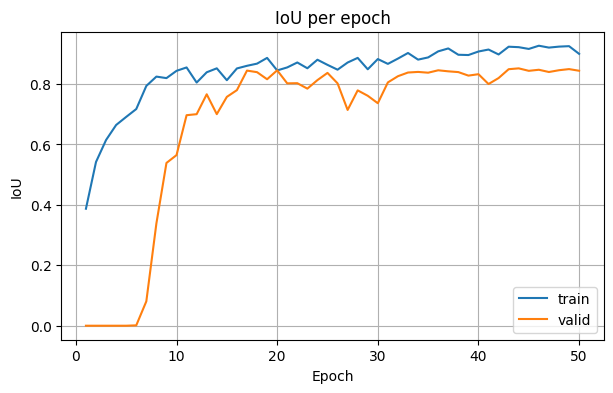

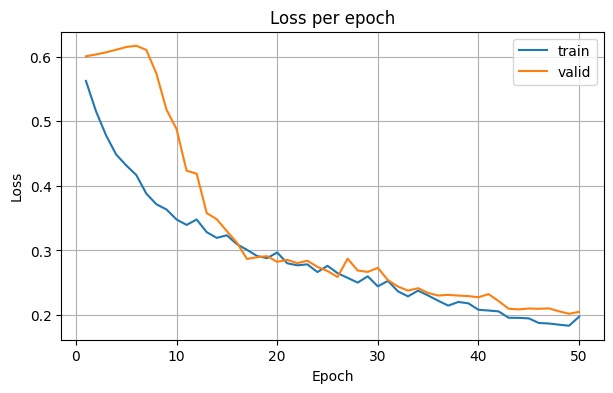

In [102]:
plot_history(history_unet_dice)

In [103]:
test_unet_dice = test(unet_model,
              test_dataloader,
              loss_fn = criterion,
              device = device)

Testing:   0%|          | 0/2 [00:00<?, ?it/s]

Test Loss: 0.2308, Test IoU: 0.8269


In [104]:
import os

save_path = '/content/drive/MyDrive/Colab Notebooks/блок HW_6/'
os.makedirs(save_path, exist_ok=True)

torch.save(unet_model.state_dict(), os.path.join(save_path, 'unet_dice.pth'))
torch.save(history_unet_dice, os.path.join(save_path, 'history_unet_dice.pt'))
torch.save(test_unet_dice, os.path.join(save_path, 'test_unet_dice.pt'))

**Focal**

In [105]:
from torchvision.ops import sigmoid_focal_loss

In [106]:
unet_model = UNet().to(device)
optimizer = optim.Adam(unet_model.parameters(), lr=1e-4)
criterion = lambda outputs, targets: sigmoid_focal_loss(outputs, targets, reduction='mean')

history_unet_focal = fit(unet_model,
              train_dataloader,
              valid_dataloader,
              optimizer,
              loss_fn = criterion,
              device = device,
              epochs = 50,
              model_name="unet_focal")

Epoch 1/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0962, Train IoU: 0.2648
  Valid Loss: 0.0943, Valid IoU: 0.0000
  Saved best model with Valid Loss: 0.0943
Epoch 2/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0779, Train IoU: 0.4511
  Valid Loss: 0.0935, Valid IoU: 0.0000
  Saved best model with Valid Loss: 0.0935
Epoch 3/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0678, Train IoU: 0.5370
  Valid Loss: 0.0920, Valid IoU: 0.0010
  Saved best model with Valid Loss: 0.0920
Epoch 4/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0582, Train IoU: 0.5991
  Valid Loss: 0.0895, Valid IoU: 0.0010
  Saved best model with Valid Loss: 0.0895
Epoch 5/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0510, Train IoU: 0.6358
  Valid Loss: 0.0855, Valid IoU: 0.0006
  Saved best model with Valid Loss: 0.0855
Epoch 6/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0448, Train IoU: 0.6933
  Valid Loss: 0.0803, Valid IoU: 0.0004
  Saved best model with Valid Loss: 0.0803
Epoch 7/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0394, Train IoU: 0.7356
  Valid Loss: 0.0741, Valid IoU: 0.0363
  Saved best model with Valid Loss: 0.0741
Epoch 8/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0353, Train IoU: 0.7520
  Valid Loss: 0.0646, Valid IoU: 0.2906
  Saved best model with Valid Loss: 0.0646
Epoch 9/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0336, Train IoU: 0.7607
  Valid Loss: 0.0556, Valid IoU: 0.5525
  Saved best model with Valid Loss: 0.0556
Epoch 10/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0299, Train IoU: 0.7853
  Valid Loss: 0.0458, Valid IoU: 0.6263
  Saved best model with Valid Loss: 0.0458
Epoch 11/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0266, Train IoU: 0.8277
  Valid Loss: 0.0429, Valid IoU: 0.6938
  Saved best model with Valid Loss: 0.0429
Epoch 12/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0270, Train IoU: 0.8217
  Valid Loss: 0.0379, Valid IoU: 0.7472
  Saved best model with Valid Loss: 0.0379
Epoch 13/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0263, Train IoU: 0.8030
  Valid Loss: 0.0727, Valid IoU: 0.6658
Epoch 14/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0239, Train IoU: 0.8208
  Valid Loss: 0.0321, Valid IoU: 0.8027
  Saved best model with Valid Loss: 0.0321
Epoch 15/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0237, Train IoU: 0.8174
  Valid Loss: 0.0261, Valid IoU: 0.7702
  Saved best model with Valid Loss: 0.0261
Epoch 16/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0215, Train IoU: 0.8406
  Valid Loss: 0.0252, Valid IoU: 0.7884
  Saved best model with Valid Loss: 0.0252
Epoch 17/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0214, Train IoU: 0.8473
  Valid Loss: 0.0273, Valid IoU: 0.8236
Epoch 18/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0195, Train IoU: 0.8603
  Valid Loss: 0.0271, Valid IoU: 0.8176
Epoch 19/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0197, Train IoU: 0.8546
  Valid Loss: 0.0234, Valid IoU: 0.8037
  Saved best model with Valid Loss: 0.0234
Epoch 20/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0180, Train IoU: 0.8630
  Valid Loss: 0.0215, Valid IoU: 0.7748
  Saved best model with Valid Loss: 0.0215
Epoch 21/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0172, Train IoU: 0.8717
  Valid Loss: 0.0216, Valid IoU: 0.8446
Epoch 22/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0165, Train IoU: 0.8804
  Valid Loss: 0.0206, Valid IoU: 0.8358
  Saved best model with Valid Loss: 0.0206
Epoch 23/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0157, Train IoU: 0.8897
  Valid Loss: 0.0195, Valid IoU: 0.8461
  Saved best model with Valid Loss: 0.0195
Epoch 24/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0155, Train IoU: 0.8886
  Valid Loss: 0.0198, Valid IoU: 0.8483
Epoch 25/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0155, Train IoU: 0.8846
  Valid Loss: 0.0201, Valid IoU: 0.8327
Epoch 26/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0140, Train IoU: 0.8990
  Valid Loss: 0.0212, Valid IoU: 0.8371
Epoch 27/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0141, Train IoU: 0.8955
  Valid Loss: 0.0208, Valid IoU: 0.8297
Epoch 28/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0133, Train IoU: 0.9106
  Valid Loss: 0.0186, Valid IoU: 0.8232
  Saved best model with Valid Loss: 0.0186
Epoch 29/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0136, Train IoU: 0.8980
  Valid Loss: 0.0175, Valid IoU: 0.8330
  Saved best model with Valid Loss: 0.0175
Epoch 30/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0124, Train IoU: 0.9066
  Valid Loss: 0.0180, Valid IoU: 0.8459
Epoch 31/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0125, Train IoU: 0.9150
  Valid Loss: 0.0210, Valid IoU: 0.8543
Epoch 32/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0121, Train IoU: 0.9156
  Valid Loss: 0.0198, Valid IoU: 0.8564
Epoch 33/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0115, Train IoU: 0.9135
  Valid Loss: 0.0178, Valid IoU: 0.8521
Epoch 34/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0121, Train IoU: 0.9098
  Valid Loss: 0.0206, Valid IoU: 0.8590
Epoch 35/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0154, Train IoU: 0.8645
  Valid Loss: 0.0170, Valid IoU: 0.8640
  Saved best model with Valid Loss: 0.0170
Epoch 36/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0118, Train IoU: 0.9012
  Valid Loss: 0.0202, Valid IoU: 0.8456
Epoch 37/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0114, Train IoU: 0.9151
  Valid Loss: 0.0185, Valid IoU: 0.8515
Epoch 38/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0106, Train IoU: 0.9178
  Valid Loss: 0.0163, Valid IoU: 0.8434
  Saved best model with Valid Loss: 0.0163
Epoch 39/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0109, Train IoU: 0.9119
  Valid Loss: 0.0161, Valid IoU: 0.8582
  Saved best model with Valid Loss: 0.0161
Epoch 40/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0107, Train IoU: 0.9089
  Valid Loss: 0.0209, Valid IoU: 0.8503
Epoch 41/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0108, Train IoU: 0.9172
  Valid Loss: 0.0256, Valid IoU: 0.8350
Epoch 42/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0100, Train IoU: 0.9192
  Valid Loss: 0.0232, Valid IoU: 0.8410
Epoch 43/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0113, Train IoU: 0.9029
  Valid Loss: 0.0173, Valid IoU: 0.8543
Epoch 44/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0097, Train IoU: 0.9237
  Valid Loss: 0.0173, Valid IoU: 0.8705
Epoch 45/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0094, Train IoU: 0.9288
  Valid Loss: 0.0164, Valid IoU: 0.8717
Epoch 46/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0093, Train IoU: 0.9286
  Valid Loss: 0.0157, Valid IoU: 0.8693
  Saved best model with Valid Loss: 0.0157
Epoch 47/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0103, Train IoU: 0.9128
  Valid Loss: 0.0173, Valid IoU: 0.8512
Epoch 48/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0088, Train IoU: 0.9233
  Valid Loss: 0.0181, Valid IoU: 0.8518
Epoch 49/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0088, Train IoU: 0.9325
  Valid Loss: 0.0165, Valid IoU: 0.8682
Epoch 50/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.0105, Train IoU: 0.9101
  Valid Loss: 0.0189, Valid IoU: 0.8550


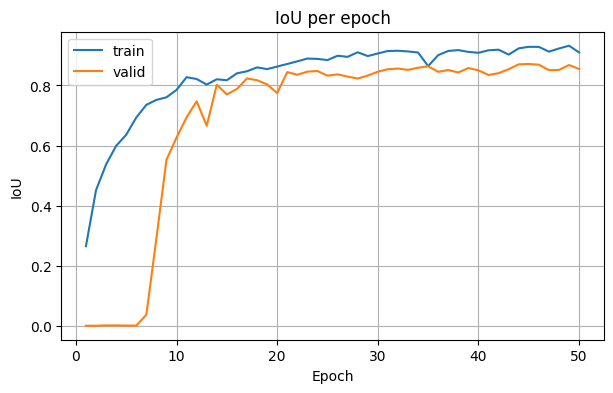

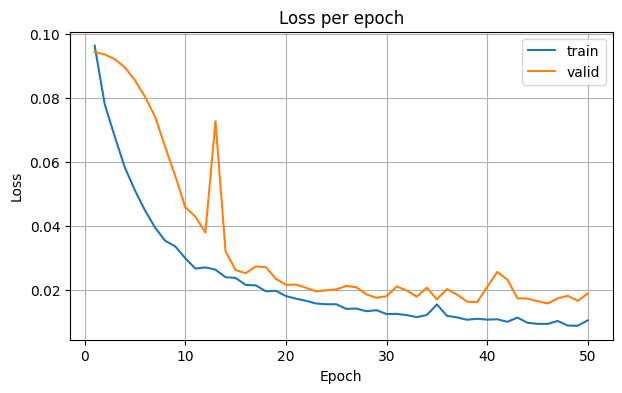

In [107]:
plot_history(history_unet_focal)

In [108]:
test_unet_focal = test(unet_model,
              test_dataloader,
              loss_fn = criterion,
              device = device)

Testing:   0%|          | 0/2 [00:00<?, ?it/s]

Test Loss: 0.0200, Test IoU: 0.8387


In [109]:
import os

save_path = '/content/drive/MyDrive/Colab Notebooks/блок HW_6/'
os.makedirs(save_path, exist_ok=True)

torch.save(unet_model.state_dict(), os.path.join(save_path, 'unet_focal.pth'))
torch.save(history_unet_focal, os.path.join(save_path, 'history_unet_focal.pt'))
torch.save(test_unet_focal, os.path.join(save_path, 'test_unet_focal.pt'))

**Tversky**

In [110]:
unet_model = UNet().to(device)
optimizer = optim.Adam(unet_model.parameters(), lr=1e-4)
criterion = tversky_loss


history_unet_tversky = fit(unet_model,
              train_dataloader,
              valid_dataloader,
              optimizer,
              loss_fn = criterion,
              device =device,
              epochs = 50,
              model_name="unet_tvesky")

Epoch 1/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5905, Train IoU: 0.3009
  Valid Loss: 0.5938, Valid IoU: 0.3406
  Saved best model with Valid Loss: 0.5938
Epoch 2/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5641, Train IoU: 0.3896
  Valid Loss: 0.5885, Valid IoU: 0.3397
  Saved best model with Valid Loss: 0.5885
Epoch 3/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5420, Train IoU: 0.4329
  Valid Loss: 0.5833, Valid IoU: 0.3387
  Saved best model with Valid Loss: 0.5833
Epoch 4/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5234, Train IoU: 0.4619
  Valid Loss: 0.5781, Valid IoU: 0.3387
  Saved best model with Valid Loss: 0.5781
Epoch 5/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.5019, Train IoU: 0.4907
  Valid Loss: 0.5734, Valid IoU: 0.3387
  Saved best model with Valid Loss: 0.5734
Epoch 6/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4860, Train IoU: 0.5184
  Valid Loss: 0.5681, Valid IoU: 0.3387
  Saved best model with Valid Loss: 0.5681
Epoch 7/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4682, Train IoU: 0.5571
  Valid Loss: 0.5594, Valid IoU: 0.4163
  Saved best model with Valid Loss: 0.5594
Epoch 8/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4579, Train IoU: 0.5856
  Valid Loss: 0.5285, Valid IoU: 0.4591
  Saved best model with Valid Loss: 0.5285
Epoch 9/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4369, Train IoU: 0.6197
  Valid Loss: 0.5080, Valid IoU: 0.4246
  Saved best model with Valid Loss: 0.5080
Epoch 10/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4212, Train IoU: 0.6670
  Valid Loss: 0.4761, Valid IoU: 0.5702
  Saved best model with Valid Loss: 0.4761
Epoch 11/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.4113, Train IoU: 0.6960
  Valid Loss: 0.4473, Valid IoU: 0.5575
  Saved best model with Valid Loss: 0.4473
Epoch 12/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3948, Train IoU: 0.7382
  Valid Loss: 0.4206, Valid IoU: 0.5625
  Saved best model with Valid Loss: 0.4206
Epoch 13/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3835, Train IoU: 0.7613
  Valid Loss: 0.3941, Valid IoU: 0.6642
  Saved best model with Valid Loss: 0.3941
Epoch 14/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3825, Train IoU: 0.7533
  Valid Loss: 0.3767, Valid IoU: 0.7074
  Saved best model with Valid Loss: 0.3767
Epoch 15/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3648, Train IoU: 0.8058
  Valid Loss: 0.3618, Valid IoU: 0.7036
  Saved best model with Valid Loss: 0.3618
Epoch 16/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3567, Train IoU: 0.8177
  Valid Loss: 0.3485, Valid IoU: 0.7735
  Saved best model with Valid Loss: 0.3485
Epoch 17/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3511, Train IoU: 0.8181
  Valid Loss: 0.3509, Valid IoU: 0.6975
Epoch 18/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3427, Train IoU: 0.8271
  Valid Loss: 0.3401, Valid IoU: 0.7009
  Saved best model with Valid Loss: 0.3401
Epoch 19/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3391, Train IoU: 0.8257
  Valid Loss: 0.3299, Valid IoU: 0.7301
  Saved best model with Valid Loss: 0.3299
Epoch 20/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3272, Train IoU: 0.8449
  Valid Loss: 0.3243, Valid IoU: 0.8056
  Saved best model with Valid Loss: 0.3243
Epoch 21/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3179, Train IoU: 0.8601
  Valid Loss: 0.3217, Valid IoU: 0.7867
  Saved best model with Valid Loss: 0.3217
Epoch 22/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3057, Train IoU: 0.8881
  Valid Loss: 0.3128, Valid IoU: 0.7907
  Saved best model with Valid Loss: 0.3128
Epoch 23/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3025, Train IoU: 0.8770
  Valid Loss: 0.3057, Valid IoU: 0.8175
  Saved best model with Valid Loss: 0.3057
Epoch 24/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.3059, Train IoU: 0.8546
  Valid Loss: 0.3129, Valid IoU: 0.7993
Epoch 25/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2912, Train IoU: 0.8822
  Valid Loss: 0.3008, Valid IoU: 0.8122
  Saved best model with Valid Loss: 0.3008
Epoch 26/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2888, Train IoU: 0.8682
  Valid Loss: 0.2876, Valid IoU: 0.8218
  Saved best model with Valid Loss: 0.2876
Epoch 27/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2750, Train IoU: 0.8962
  Valid Loss: 0.2828, Valid IoU: 0.8361
  Saved best model with Valid Loss: 0.2828
Epoch 28/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2697, Train IoU: 0.8989
  Valid Loss: 0.2750, Valid IoU: 0.8464
  Saved best model with Valid Loss: 0.2750
Epoch 29/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2711, Train IoU: 0.8846
  Valid Loss: 0.2756, Valid IoU: 0.8337
Epoch 30/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2662, Train IoU: 0.8953
  Valid Loss: 0.2706, Valid IoU: 0.8421
  Saved best model with Valid Loss: 0.2706
Epoch 31/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2551, Train IoU: 0.9058
  Valid Loss: 0.2661, Valid IoU: 0.8299
  Saved best model with Valid Loss: 0.2661
Epoch 32/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2456, Train IoU: 0.9103
  Valid Loss: 0.2625, Valid IoU: 0.8507
  Saved best model with Valid Loss: 0.2625
Epoch 33/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2463, Train IoU: 0.9057
  Valid Loss: 0.2607, Valid IoU: 0.8494
  Saved best model with Valid Loss: 0.2607
Epoch 34/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2377, Train IoU: 0.9191
  Valid Loss: 0.2571, Valid IoU: 0.8400
  Saved best model with Valid Loss: 0.2571
Epoch 35/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2420, Train IoU: 0.8930
  Valid Loss: 0.2585, Valid IoU: 0.8232
Epoch 36/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2273, Train IoU: 0.9174
  Valid Loss: 0.2456, Valid IoU: 0.8415
  Saved best model with Valid Loss: 0.2456
Epoch 37/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2234, Train IoU: 0.9246
  Valid Loss: 0.2431, Valid IoU: 0.8492
  Saved best model with Valid Loss: 0.2431
Epoch 38/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2204, Train IoU: 0.9101
  Valid Loss: 0.2406, Valid IoU: 0.8429
  Saved best model with Valid Loss: 0.2406
Epoch 39/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2220, Train IoU: 0.9058
  Valid Loss: 0.2418, Valid IoU: 0.8268
Epoch 40/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2139, Train IoU: 0.9107
  Valid Loss: 0.2363, Valid IoU: 0.8310
  Saved best model with Valid Loss: 0.2363
Epoch 41/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2247, Train IoU: 0.8867
  Valid Loss: 0.2307, Valid IoU: 0.8345
  Saved best model with Valid Loss: 0.2307
Epoch 42/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2081, Train IoU: 0.9076
  Valid Loss: 0.2412, Valid IoU: 0.7957
Epoch 43/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2000, Train IoU: 0.9243
  Valid Loss: 0.2153, Valid IoU: 0.8572
  Saved best model with Valid Loss: 0.2153
Epoch 44/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2029, Train IoU: 0.9079
  Valid Loss: 0.2148, Valid IoU: 0.8435
  Saved best model with Valid Loss: 0.2148
Epoch 45/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.2145, Train IoU: 0.8716
  Valid Loss: 0.2060, Valid IoU: 0.8585
  Saved best model with Valid Loss: 0.2060
Epoch 46/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1884, Train IoU: 0.9249
  Valid Loss: 0.2144, Valid IoU: 0.8416
Epoch 47/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1835, Train IoU: 0.9312
  Valid Loss: 0.2134, Valid IoU: 0.8362
Epoch 48/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1809, Train IoU: 0.9319
  Valid Loss: 0.2028, Valid IoU: 0.8566
  Saved best model with Valid Loss: 0.2028
Epoch 49/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1943, Train IoU: 0.8832
  Valid Loss: 0.2183, Valid IoU: 0.8189
Epoch 50/50


Training:   0%|          | 0/4 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]

  Train Loss: 0.1827, Train IoU: 0.9189
  Valid Loss: 0.2149, Valid IoU: 0.8050


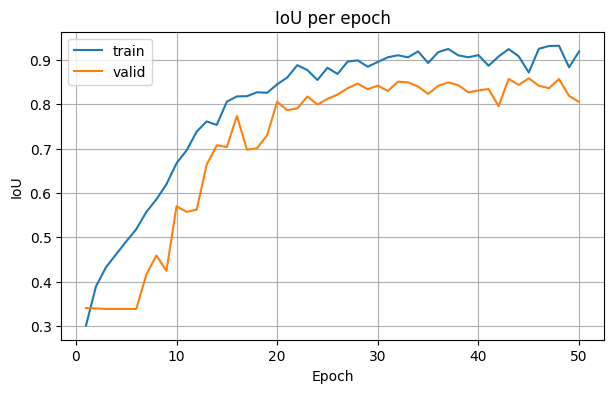

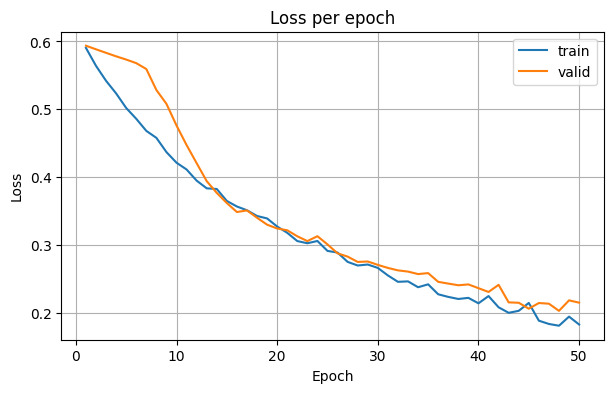

In [111]:
plot_history(history_unet_tversky)

In [112]:
test_unet_tversky = test(unet_model,
              test_dataloader,
              loss_fn = criterion,
              device = device)

Testing:   0%|          | 0/2 [00:00<?, ?it/s]

Test Loss: 0.2415, Test IoU: 0.7813


In [113]:
import os

save_path = '/content/drive/MyDrive/Colab Notebooks/блок HW_6/'
os.makedirs(save_path, exist_ok=True)

torch.save(unet_model.state_dict(), os.path.join(save_path, 'unet_tversky.pth'))
torch.save(history_unet_tversky, os.path.join(save_path, 'history_unet_tversky.pt'))
torch.save(test_unet_tversky, os.path.join(save_path, 'test_unet_tversky.pt'))

По метрике лучшие результаты у BCE:

In [114]:
print(f'Valid unet BCE IoU: {history_unet_bce["valid_iou"][-1]}')
print(f'Valid unet dice IoU: {history_unet_dice["valid_iou"][-1]}')
print(f'Valid unet focal IoU: {history_unet_focal["valid_iou"][-1]}')
print(f'Valid unet tversky IoU: {history_unet_tversky["valid_iou"][-1]}')


Valid unet BCE IoU: 0.8801813721656799
Valid unet dice IoU: 0.843914806842804
Valid unet focal IoU: 0.8549759685993195
Valid unet tversky IoU: 0.8049980700016022


In [115]:
print(f'Test segnet BCE IoU: {test_unet_bce[1]}')
print(f'Test segnet dice IoU: {test_unet_dice[1]}')
print(f'Test segnet focal IoU: {test_unet_focal[1]}')
print(f'Test segnet tversky IoU: {test_unet_tversky[1]}')


Test segnet BCE IoU: 0.8555945456027985
Test segnet dice IoU: 0.8268710672855377
Test segnet focal IoU: 0.8386868536472321
Test segnet tversky IoU: 0.7813063561916351


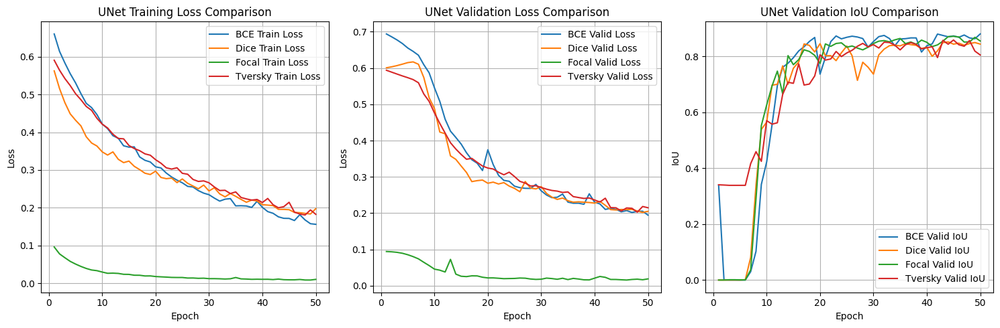

In [118]:
histories_unet = {
    "BCE": history_unet_bce,
    "Dice": history_unet_dice,
    "Focal": history_unet_focal,
    "Tversky": history_unet_tversky,
}

plot_multiple_histories(histories_unet, title_prefix="UNet")


In [119]:
models = histories_unet

Лучшая сходимость у Focal:

In [120]:
norm_losses = {}
for name, log in models.items():
    norm_losses[name] = normalize_loss(log['train_loss'])


for name, losses in norm_losses.items():
    for epoch, l in enumerate(losses):
        if l < 0.1:  # 10% от начального лосса
            print(f"{name} достиг нормированного порога на эпохе {epoch+1}")
            break


BCE достиг нормированного порога на эпохе 35
Dice достиг нормированного порога на эпохе 37
Focal достиг нормированного порога на эпохе 21
Tversky достиг нормированного порога на эпохе 38


In [121]:
norm_valid_losses = {}
for name, log in models.items():
    norm_valid_losses[name] = normalize_loss(log['valid_loss'])

for name, losses in norm_valid_losses.items():
    for epoch, l in enumerate(losses):
        if l < 0.1:  # 10% от начального лосса
            print(f"{name} достиг нормированного порога на эпохе {epoch+1}")
            break


BCE достиг нормированного порога на эпохе 32
Dice достиг нормированного порога на эпохе 33
Focal достиг нормированного порога на эпохе 19
Tversky достиг нормированного порога на эпохе 38
